In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from scipy.spatial.distance import cosine
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

import string
from sklearn.metrics import mean_squared_error
import csv

from sklearn.feature_extraction.text import TfidfTransformer
from nltk.stem.porter import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
lem = WordNetLemmatizer()
stem = PorterStemmer()

# Libraries for text preprocessing
import re
import nltk

#nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import RegexpTokenizer
#nltk.download('wordnet') 
from nltk.stem.wordnet import WordNetLemmatizer

#Word cloud
from os import path
from PIL import Image

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.feature_extraction.text import CountVectorizer

import pandas
import seaborn as sns

#Function for sorting tf_idf in descending order
from scipy.sparse import coo_matrix

from PIL import Image
import requests
from io import BytesIO


In [2]:
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\amanj\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\amanj\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [2]:
forbes = pd.read_csv("Forbes.csv")

In [4]:
imdb = pd.read_csv("imdb_full.csv")

In [5]:
forbes.head()

,Name_name,Name_Bio,Name_Image,Name_Rank
0,Virat Kohli,The cricket star occupies top spot on the 2019...,https://www.forbesindia.com/media/celeblist201...,1
1,Akshay Kumar,The actor beat global A-listers like Rihanna a...,https://www.forbesindia.com/media/celeblist201...,2
2,Salman Khan,Salman Khan slipped from the top position on t...,https://www.forbesindia.com/media/celeblist201...,3
3,Amitabh Bachchan,Amitabh Bachchan has moved further up the rank...,https://www.forbesindia.com/media/celeblist201...,4
4,MS Dhoni,MS Dhoni is steady at No 5 because of his bran...,https://www.forbesindia.com/media/celeblist201...,5


In [6]:
imdb.head()

,web-scraper-order,web-scraper-start-url,link1,link1-href,link2,link2-href,imgurl-src,born,nickname,height,bio,name,birth name
0,1588008158-4124,https://www.imdb.com/list/ls002913270/,Aamir Khan,https://www.imdb.com/name/nm0451148?ref_=nmls_hd,See full bio,https://www.imdb.com/name/nm0451148/bio?ref_=n...,https://m.media-amazon.com/images/M/MV5BMjAwMj...,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",Aamir is no doubt one of the most dedicated ac...,Aamir Khan,NaN
1,1588007983-4102,https://www.imdb.com/list/ls002913270/,Madhuri Dixit,https://www.imdb.com/name/nm0002043?ref_=nmls_hd,See full bio,https://www.imdb.com/name/nm0002043/bio?ref_=n...,https://m.media-amazon.com/images/M/MV5BNTk0OT...,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",Madhuri Dixit is one of the most acclaimed act...,Madhuri Dixit,Madhuri Shankar Dixit
2,1588007423-4037,https://www.imdb.com/list/ls002913270/,Manisha Koirala,https://www.imdb.com/name/nm0463539?ref_=nmls_hd,See full bio,https://www.imdb.com/name/nm0463539/bio?ref_=n...,https://m.media-amazon.com/images/M/MV5BMjMwMD...,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",Manisha Koirala (born 16 August 1970) is a Nep...,Manisha Koirala,Manisha P. Koirala
3,1588007645-4065,https://www.imdb.com/list/ls002913270/,Shriya Saran,https://www.imdb.com/name/nm1328152?ref_=nmls_hd,See full bio,https://www.imdb.com/name/nm1328152/bio?ref_=n...,https://m.media-amazon.com/images/M/MV5BMTk4MD...,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)","Shriya Saran also known by the mononym Shriya,...",Shriya Saran,Shriya Saran Bhatnagar
4,1588007511-4049,https://www.imdb.com/list/ls002913270/,Abhay Deol,https://www.imdb.com/name/nm1867717?ref_=nmls_hd,See full bio,https://www.imdb.com/name/nm1867717/bio?ref_=n...,https://m.media-amazon.com/images/M/MV5BMTU2Nz...,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)","Abhay Deol (born in 1976, India) is an Indian ...",Abhay Deol,NaN


In [7]:
#removing unwanted columns
imdb.drop(["web-scraper-order" , "web-scraper-start-url" ,"link1" ,"link1-href" ,"link2" ,"link2-href"] , axis=1)

,imgurl-src,born,nickname,height,bio,name,birth name
0,https://m.media-amazon.com/images/M/MV5BMjAwMj...,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",Aamir is no doubt one of the most dedicated ac...,Aamir Khan,NaN
1,https://m.media-amazon.com/images/M/MV5BNTk0OT...,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",Madhuri Dixit is one of the most acclaimed act...,Madhuri Dixit,Madhuri Shankar Dixit
2,https://m.media-amazon.com/images/M/MV5BMjMwMD...,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",Manisha Koirala (born 16 August 1970) is a Nep...,Manisha Koirala,Manisha P. Koirala
3,https://m.media-amazon.com/images/M/MV5BMTk4MD...,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)","Shriya Saran also known by the mononym Shriya,...",Shriya Saran,Shriya Saran Bhatnagar
4,https://m.media-amazon.com/images/M/MV5BMTU2Nz...,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)","Abhay Deol (born in 1976, India) is an Indian ...",Abhay Deol,NaN
...,...,...,...,...,...,...,...
95,https://m.media-amazon.com/images/M/MV5BNDI3Mj...,"January 1, \n \n1979 \n \nin Bombay, M...",NaN,"5' 2"" (1.57 m)","Vidya was born in Palghat, Kerala, India. Her ...",Vidya Balan,Vidya P. Balan
96,https://m.media-amazon.com/images/M/MV5BMzMyYT...,"December 29, \n \n1974 \n \nin Pune, M...",NaN,"5' 3"" (1.6 m)",Very few people have the privilege of being bo...,Twinkle Khanna,Tina Jatin Khanna
97,https://m.media-amazon.com/images/M/MV5BMzExNz...,"September 12, \n \n1988 \n \nin Surat,...",NaN,"5' 2"" (1.57 m)",She is best known for her role as Bani Walia i...,Prachi Desai,NaN
98,https://m.media-amazon.com/images/M/MV5BMTk1Nj...,"February 5, \n \n1976 \n \nin Bombay, ...",Baby B\nJunior B\nA B\nJunior\nAbi\nAbhi\nAB Baby,"6' 1"" (1.85 m)",Aquarian Abhishek Srivastav was born in Februa...,Abhishek Bachchan,Abhishek Amitabh Srivastav


In [25]:
imdb.rename(columns ={ "Name_name" : "name" , "Name_Bio" : "bio" , "Name_image_url" : "img" })

,name,bio,Unnamed: 2,img
0,Shah Rukh Khan,Shahrukh Khan was born on 2 November 1965 in N...,NaN,https://www.imdb.com/name/nm0451321/?ref_=nmls...
1,Aamir Khan,Aamir is no doubt one of the most dedicated ac...,NaN,https://www.imdb.com/name/nm0451148/?ref_=nmls...
2,Salman Khan,"Born on December 27, 1965 Salman Khan is the s...",NaN,https://www.imdb.com/name/nm0006795/?ref_=nmls...
3,Katrina Kaif,"Katrina Kaif is one of eight siblings, 7 girls...",NaN,https://www.imdb.com/name/nm1229940/?ref_=nmls...
4,Kareena Kapoor,Kareena was born to Sindhi-speaking Babita (ne...,NaN,https://www.imdb.com/name/nm0004626/?ref_=nmls...
...,...,...,...,...
95,Emraan Hashmi,Emraan Hashmi was born 24 March 1979) is an In...,NaN,https://www.imdb.com/name/nm1431656/?ref_=nmls...
96,Mallika Sherawat,"Mallika Sherawat was born on October 24, 1976 ...",NaN,https://www.imdb.com/name/nm1324246/?ref_=nmls...
97,Nawazuddin Siddiqui,Nawazuddin Siddiqui (born 1974) also known as ...,NaN,https://www.imdb.com/name/nm1596350/?ref_=nmls...
98,Aditya Roy Kapoor,"Aditya Roy Kapoor was born on November 16, 198...",NaN,https://www.imdb.com/name/nm3169069/?ref_=nmls...


In [8]:
#removing unwanted columns
imdb = imdb.drop(["web-scraper-order" , "web-scraper-start-url" ,"link1" ,"link1-href" ,"link2" ,"link2-href"] , axis=1)

In [10]:
imdb.columns

Index(['imgurl-src', 'born', 'nickname', 'height', 'bio', 'name',
       'birth name'],
      dtype='object')

In [11]:
imdb = imdb.rename(columns ={ "imgurl-src" : "img" })

In [12]:
imdb.head()

,img,born,nickname,height,bio,name,birth name
0,https://m.media-amazon.com/images/M/MV5BMjAwMj...,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",Aamir is no doubt one of the most dedicated ac...,Aamir Khan,NaN
1,https://m.media-amazon.com/images/M/MV5BNTk0OT...,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",Madhuri Dixit is one of the most acclaimed act...,Madhuri Dixit,Madhuri Shankar Dixit
2,https://m.media-amazon.com/images/M/MV5BMjMwMD...,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",Manisha Koirala (born 16 August 1970) is a Nep...,Manisha Koirala,Manisha P. Koirala
3,https://m.media-amazon.com/images/M/MV5BMTk4MD...,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)","Shriya Saran also known by the mononym Shriya,...",Shriya Saran,Shriya Saran Bhatnagar
4,https://m.media-amazon.com/images/M/MV5BMTU2Nz...,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)","Abhay Deol (born in 1976, India) is an Indian ...",Abhay Deol,NaN


In [13]:
forbes.head()

,Name_name,Name_Bio,Name_Image,Name_Rank
0,Virat Kohli,The cricket star occupies top spot on the 2019...,https://www.forbesindia.com/media/celeblist201...,1
1,Akshay Kumar,The actor beat global A-listers like Rihanna a...,https://www.forbesindia.com/media/celeblist201...,2
2,Salman Khan,Salman Khan slipped from the top position on t...,https://www.forbesindia.com/media/celeblist201...,3
3,Amitabh Bachchan,Amitabh Bachchan has moved further up the rank...,https://www.forbesindia.com/media/celeblist201...,4
4,MS Dhoni,MS Dhoni is steady at No 5 because of his bran...,https://www.forbesindia.com/media/celeblist201...,5


In [14]:
forbes = forbes.rename(columns = { "Name_name" : "name" , "Name_Bio" : "bio" , "Name_Image" : "img" , "Name_Rank" : "rank"})

In [15]:
forbes.head()

,name,bio,img,rank
0,Virat Kohli,The cricket star occupies top spot on the 2019...,https://www.forbesindia.com/media/celeblist201...,1
1,Akshay Kumar,The actor beat global A-listers like Rihanna a...,https://www.forbesindia.com/media/celeblist201...,2
2,Salman Khan,Salman Khan slipped from the top position on t...,https://www.forbesindia.com/media/celeblist201...,3
3,Amitabh Bachchan,Amitabh Bachchan has moved further up the rank...,https://www.forbesindia.com/media/celeblist201...,4
4,MS Dhoni,MS Dhoni is steady at No 5 because of his bran...,https://www.forbesindia.com/media/celeblist201...,5


In [16]:
imdb.head()

,img,born,nickname,height,bio,name,birth name
0,https://m.media-amazon.com/images/M/MV5BMjAwMj...,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",Aamir is no doubt one of the most dedicated ac...,Aamir Khan,NaN
1,https://m.media-amazon.com/images/M/MV5BNTk0OT...,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",Madhuri Dixit is one of the most acclaimed act...,Madhuri Dixit,Madhuri Shankar Dixit
2,https://m.media-amazon.com/images/M/MV5BMjMwMD...,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",Manisha Koirala (born 16 August 1970) is a Nep...,Manisha Koirala,Manisha P. Koirala
3,https://m.media-amazon.com/images/M/MV5BMTk4MD...,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)","Shriya Saran also known by the mononym Shriya,...",Shriya Saran,Shriya Saran Bhatnagar
4,https://m.media-amazon.com/images/M/MV5BMTU2Nz...,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)","Abhay Deol (born in 1976, India) is an Indian ...",Abhay Deol,NaN


In [17]:
imdb = imdb[['name', 'bio', 'born', 'nickname', 'height','img' ,'birth name']]

In [18]:
imdb.head()

,name,bio,born,nickname,height,img,birth name
0,Aamir Khan,Aamir is no doubt one of the most dedicated ac...,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",https://m.media-amazon.com/images/M/MV5BMjAwMj...,NaN
1,Madhuri Dixit,Madhuri Dixit is one of the most acclaimed act...,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BNTk0OT...,Madhuri Shankar Dixit
2,Manisha Koirala,Manisha Koirala (born 16 August 1970) is a Nep...,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BMjMwMD...,Manisha P. Koirala
3,Shriya Saran,"Shriya Saran also known by the mononym Shriya,...","September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)",https://m.media-amazon.com/images/M/MV5BMTk4MD...,Shriya Saran Bhatnagar
4,Abhay Deol,"Abhay Deol (born in 1976, India) is an Indian ...","March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)",https://m.media-amazon.com/images/M/MV5BMTU2Nz...,NaN


In [19]:
#merging the data from two different websites
df = pd.merge(imdb, forbes, on='name', how='outer')

In [20]:
df

,name,bio_x,born,nickname,height,img_x,birth name,bio_y,img_y,rank
0,Aamir Khan,Aamir is no doubt one of the most dedicated ac...,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",https://m.media-amazon.com/images/M/MV5BMjAwMj...,NaN,Aamir Khan slipped nine spots without a single...,https://www.forbesindia.com/media/celeblist201...,15.0
1,Madhuri Dixit,Madhuri Dixit is one of the most acclaimed act...,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BNTk0OT...,Madhuri Shankar Dixit,NaN,NaN,NaN
2,Manisha Koirala,Manisha Koirala (born 16 August 1970) is a Nep...,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BMjMwMD...,Manisha P. Koirala,NaN,NaN,NaN
3,Shriya Saran,"Shriya Saran also known by the mononym Shriya,...","September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)",https://m.media-amazon.com/images/M/MV5BMTk4MD...,Shriya Saran Bhatnagar,NaN,NaN,NaN
4,Abhay Deol,"Abhay Deol (born in 1976, India) is an Indian ...","March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)",https://m.media-amazon.com/images/M/MV5BMTU2Nz...,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
169,Ranveer Brar,NaN,NaN,NaN,NaN,NaN,NaN,Ranveer Brar is the second-highest earning cel...,https://www.forbesindia.com/media/celeblist201...,96.0
170,Vikas Khanna,NaN,NaN,NaN,NaN,NaN,NaN,Best known for his Michelin-starred Manhattan ...,https://www.forbesindia.com/media/celeblist201...,97.0
171,Rohan Bopanna,NaN,NaN,NaN,NaN,NaN,NaN,Bopanna has had an active 2018-19 playing seve...,https://www.forbesindia.com/media/celeblist201...,98.0
172,Vicky Ratnani,NaN,NaN,NaN,NaN,NaN,NaN,"With web series Vicky the Gastronaut, Chef Vic...",https://www.forbesindia.com/media/celeblist201...,99.0


In [21]:
# saving the dataframe 
df.to_csv('final_full.csv')

In [22]:
df["bio_x"] = df["bio_x"].fillna("")

In [23]:
df["bio_x"]

0      Aamir is no doubt one of the most dedicated ac...
1      Madhuri Dixit is one of the most acclaimed act...
2      Manisha Koirala (born 16 August 1970) is a Nep...
3      Shriya Saran also known by the mononym Shriya,...
4      Abhay Deol (born in 1976, India) is an Indian ...
                             ...                        
169                                                     
170                                                     
171                                                     
172                                                     
173                                                     
Name: bio_x, Length: 174, dtype: object

In [24]:
df["bio_y"] = df["bio_y"].fillna("")

In [25]:
df["bio_y"]

0      Aamir Khan slipped nine spots without a single...
1                                                       
2                                                       
3                                                       
4                                                       
                             ...                        
169    Ranveer Brar is the second-highest earning cel...
170    Best known for his Michelin-starred Manhattan ...
171    Bopanna has had an active 2018-19 playing seve...
172    With web series Vicky the Gastronaut, Chef Vic...
173    Goila makes his Celebrity 100 debut at No 100,...
Name: bio_y, Length: 174, dtype: object

In [26]:
df["rank"]

0       15.0
1        NaN
2        NaN
3        NaN
4        NaN
       ...  
169     96.0
170     97.0
171     98.0
172     99.0
173    100.0
Name: rank, Length: 174, dtype: float64

In [27]:
df["rank"] = df["rank"].fillna(-1)

In [28]:
df["rank"]

0       15.0
1       -1.0
2       -1.0
3       -1.0
4       -1.0
       ...  
169     96.0
170     97.0
171     98.0
172     99.0
173    100.0
Name: rank, Length: 174, dtype: float64

In [29]:
df["bio"] = df["bio_x"] + " " + df["bio_y"]

In [30]:
#merging the bio
df["bio"]

0      Aamir is no doubt one of the most dedicated ac...
1      Madhuri Dixit is one of the most acclaimed act...
2      Manisha Koirala (born 16 August 1970) is a Nep...
3      Shriya Saran also known by the mononym Shriya,...
4      Abhay Deol (born in 1976, India) is an Indian ...
                             ...                        
169     Ranveer Brar is the second-highest earning ce...
170     Best known for his Michelin-starred Manhattan...
171     Bopanna has had an active 2018-19 playing sev...
172     With web series Vicky the Gastronaut, Chef Vi...
173     Goila makes his Celebrity 100 debut at No 100...
Name: bio, Length: 174, dtype: object

In [31]:
df = df.drop(["bio_x" , "bio_y"]  , axis = 1)
#imdb = imdb.drop(["Unnamed: 2"] , axis=1)

In [32]:
df.head()

,name,born,nickname,height,img_x,birth name,img_y,rank,bio
0,Aamir Khan,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",https://m.media-amazon.com/images/M/MV5BMjAwMj...,NaN,https://www.forbesindia.com/media/celeblist201...,15.0,Aamir is no doubt one of the most dedicated ac...
1,Madhuri Dixit,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BNTk0OT...,Madhuri Shankar Dixit,NaN,-1.0,Madhuri Dixit is one of the most acclaimed act...
2,Manisha Koirala,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BMjMwMD...,Manisha P. Koirala,NaN,-1.0,Manisha Koirala (born 16 August 1970) is a Nep...
3,Shriya Saran,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)",https://m.media-amazon.com/images/M/MV5BMTk4MD...,Shriya Saran Bhatnagar,NaN,-1.0,"Shriya Saran also known by the mononym Shriya,..."
4,Abhay Deol,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)",https://m.media-amazon.com/images/M/MV5BMTU2Nz...,NaN,NaN,-1.0,"Abhay Deol (born in 1976, India) is an Indian ..."


In [33]:
df.to_csv('final1_full.csv') 

In [35]:
df = pd.read_csv("final1_full.csv")

In [36]:
df.head()

,Unnamed: 0,name,born,nickname,height,img_x,birth name,img_y,rank,bio
0,0,Aamir Khan,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",https://m.media-amazon.com/images/M/MV5BMjAwMj...,NaN,https://www.forbesindia.com/media/celeblist201...,15.0,Aamir is no doubt one of the most dedicated ac...
1,1,Madhuri Dixit,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BNTk0OT...,Madhuri Shankar Dixit,NaN,-1.0,Madhuri Dixit is one of the most acclaimed act...
2,2,Manisha Koirala,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BMjMwMD...,Manisha P. Koirala,NaN,-1.0,Manisha Koirala (born 16 August 1970) is a Nep...
3,3,Shriya Saran,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)",https://m.media-amazon.com/images/M/MV5BMTk4MD...,Shriya Saran Bhatnagar,NaN,-1.0,"Shriya Saran also known by the mononym Shriya,..."
4,4,Abhay Deol,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)",https://m.media-amazon.com/images/M/MV5BMTU2Nz...,NaN,NaN,-1.0,"Abhay Deol (born in 1976, India) is an Indian ..."


In [37]:
df.drop(["Unnamed: 0"] , axis = 1)

,name,born,nickname,height,img_x,birth name,img_y,rank,bio
0,Aamir Khan,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",https://m.media-amazon.com/images/M/MV5BMjAwMj...,NaN,https://www.forbesindia.com/media/celeblist201...,15.0,Aamir is no doubt one of the most dedicated ac...
1,Madhuri Dixit,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BNTk0OT...,Madhuri Shankar Dixit,NaN,-1.0,Madhuri Dixit is one of the most acclaimed act...
2,Manisha Koirala,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BMjMwMD...,Manisha P. Koirala,NaN,-1.0,Manisha Koirala (born 16 August 1970) is a Nep...
3,Shriya Saran,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)",https://m.media-amazon.com/images/M/MV5BMTk4MD...,Shriya Saran Bhatnagar,NaN,-1.0,"Shriya Saran also known by the mononym Shriya,..."
4,Abhay Deol,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)",https://m.media-amazon.com/images/M/MV5BMTU2Nz...,NaN,NaN,-1.0,"Abhay Deol (born in 1976, India) is an Indian ..."
...,...,...,...,...,...,...,...,...,...
169,Ranveer Brar,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,96.0,Ranveer Brar is the second-highest earning ce...
170,Vikas Khanna,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,97.0,Best known for his Michelin-starred Manhattan...
171,Rohan Bopanna,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,98.0,Bopanna has had an active 2018-19 playing sev...
172,Vicky Ratnani,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,99.0,"With web series Vicky the Gastronaut, Chef Vi..."


In [38]:
dataset = df

In [39]:
#Fetch wordcount for each abstract
dataset['word_count'] = dataset['bio'].apply(lambda x: len(str(x).split(" ")))
dataset[['bio','word_count']].head()

,bio,word_count
0,Aamir is no doubt one of the most dedicated ac...,751
1,Madhuri Dixit is one of the most acclaimed act...,1253
2,Manisha Koirala (born 16 August 1970) is a Nep...,522
3,"Shriya Saran also known by the mononym Shriya,...",207
4,"Abhay Deol (born in 1976, India) is an Indian ...",87


In [40]:
dataset

,Unnamed: 0,name,born,nickname,height,img_x,birth name,img_y,rank,bio,word_count
0,0,Aamir Khan,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",https://m.media-amazon.com/images/M/MV5BMjAwMj...,NaN,https://www.forbesindia.com/media/celeblist201...,15.0,Aamir is no doubt one of the most dedicated ac...,751
1,1,Madhuri Dixit,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BNTk0OT...,Madhuri Shankar Dixit,NaN,-1.0,Madhuri Dixit is one of the most acclaimed act...,1253
2,2,Manisha Koirala,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BMjMwMD...,Manisha P. Koirala,NaN,-1.0,Manisha Koirala (born 16 August 1970) is a Nep...,522
3,3,Shriya Saran,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)",https://m.media-amazon.com/images/M/MV5BMTk4MD...,Shriya Saran Bhatnagar,NaN,-1.0,"Shriya Saran also known by the mononym Shriya,...",207
4,4,Abhay Deol,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)",https://m.media-amazon.com/images/M/MV5BMTU2Nz...,NaN,NaN,-1.0,"Abhay Deol (born in 1976, India) is an Indian ...",87
...,...,...,...,...,...,...,...,...,...,...,...
169,169,Ranveer Brar,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,96.0,Ranveer Brar is the second-highest earning ce...,19
170,170,Vikas Khanna,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,97.0,Best known for his Michelin-starred Manhattan...,20
171,171,Rohan Bopanna,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,98.0,Bopanna has had an active 2018-19 playing sev...,17
172,172,Vicky Ratnani,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,99.0,"With web series Vicky the Gastronaut, Chef Vi...",20


In [41]:
##Descriptive statistics of word counts
dataset.word_count.describe()

count     174.000000
mean      173.856322
std       243.734663
min        10.000000
25%        22.000000
50%        50.000000
75%       260.750000
max      1638.000000
Name: word_count, dtype: float64

In [42]:
#Identify common words
freq = pd.Series(' '.join(dataset['bio']).split()).value_counts()[:20]
freq

the     1146
in      1094
and     1016
a        709
of       602
to       509
was      398
her      375
for      316
with     309
his      307
is       283
as       278
on       245
she      219
has      203
She      203
he       202
film     175
He       174
dtype: int64

In [43]:
#Identify uncommon words
freq1 =  pd.Series(' '.join(dataset['bio']).split()).value_counts()[-20:]
freq1

American-Indian    1
Shobha             1
times.             1
Devlali            1
tale               1
Hassan,            1
lent               1
virtually          1
demanded           1
Raghav             1
(Bloomington),     1
infamous           1
supernatural       1
(NSD),             1
Akshit,            1
"Saawariya".       1
Limited            1
Kaho               1
Vivek,             1
episodes           1
dtype: int64

In [44]:
word = "inversely"
print("stemming:",stem.stem(word))
print("lemmatization:", lem.lemmatize(word, "v"))

stemming: invers
lemmatization: inversely


In [76]:
name = list(df["name"])

In [93]:
stopw = []
for a in name:
    for b in a.split():
        c = b.lower()
        stopw.append(b)
        stopw.append(c)

In [127]:
##Creating a list of stop words and adding custom stopwords
stop_words = set(stopwords.words("english"))
##Creating a list of custom stopwords
new_words = ["using", "show", "result", "large", "also", "iv", "one", "two", "new", "previously", "shown" , "..." , "film" , "filmfare", 'india','year','film','role','movie','award','indian','actress', 'bollywood', 'first', 'best', 'hit', 'born', 'performance', 'made', 'debut', 'office', 'box', 'list' , 'like' , 'filmfare' , 'film']
stop_words = stop_words.union(new_words)
stop_words = stop_words.union(stopw)

In [129]:
stop_words

{'...',
 'AR',
 'Aamir',
 'Aaryan',
 'Abbas',
 'Abhay',
 'Abhishek',
 'Abraham',
 'Aditi',
 'Aditya',
 'Ahuja',
 'Aishwarya',
 'Ajay',
 'Ajay-Atul',
 'Ajith',
 'Akhtar',
 'Akshay',
 'Akshaye',
 'Ali',
 'Alia',
 'Ameesha',
 'Amit',
 'Amitabh',
 'Amrita',
 'Anil',
 'Anirban',
 'Anushka',
 'Arijit',
 'Arjun',
 'Arora',
 'Arshad',
 'Asin',
 'Ayushmann',
 'Babu',
 'Bachchan',
 'Badshah',
 'Bajpayee',
 'Bajrang',
 'Balan',
 'Basu',
 'Bharti',
 'Bhatt',
 'Bipasha',
 'Bobby',
 'Bopanna',
 'Brar',
 'Bumrah',
 'Celina',
 'Chakraborty',
 'Chawla',
 'Chhetri',
 'Chitrangda',
 'Chopra',
 "D'Souza",
 'Dahiya',
 'Deepika',
 'Deol',
 'Desai',
 'Deshmukh',
 'Devgn',
 'Dhanush',
 'Dharmendra',
 'Dhawan',
 'Dhoni',
 'Dhupia',
 'Dilip',
 'Diljit',
 'Disha',
 'Divyanka',
 'Dixit',
 'Dosanjh',
 'Dutt',
 'Dutta',
 'Emraan',
 'Farhan',
 'Fernandez',
 'Gautam',
 'Genelia',
 'Gill',
 'Godse',
 'Goila',
 'Govinda',
 'Guru',
 'Haasan',
 'Hardik',
 'Harmanpreet',
 'Hashmi',
 'Hema',
 'Hrithik',
 'Hydari',
 'Imran'

In [130]:
corpus = []
for i in range(0, 174):
    #Remove punctuations
    text = re.sub('[^a-zA-Z]', ' ', dataset['bio'][i])
    
    #Convert to lowercase
    text = text.lower()
    
    #remove tags
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)
    
    # remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    
    ##Convert to list from string
    text = text.split()
    
    ##Stemming
    ps=PorterStemmer()
    #Lemmatisation
    lem = WordNetLemmatizer()
    text = [lem.lemmatize(word) for word in text if not word in stop_words] 
    text = " ".join(text)
    corpus.append(text)

In [131]:
#View corpus item
corpus[0]

'doubt dedicated actor world recent success china market combined got title world biggest superstar went rapid transformation body structure film bring reality factor character reason film loved world visible change include movie ghajini idiot talaash dhoom pk dangal recent successful movie dangal pk talaash tv serial satyamev jayate image become serious actor however truth fabulous actor come comedy played really funny iconic character cult comedy movie andaaz apna apna ishq mela dil chahta hai many done lot tvc character funny coca cola tata sky snapdeal said open chinese market film lagaan released china nationwide idiot became cult china idiot becoming big movie taare zameen par ghajini went gain huge fan following next big movie dhoom pk dangal became successful chinese recent secret superstar became huge china introduced child artiste yaadon ki baaraat youngest child trio earth ice candy man received rave review international critic classic method acting adopted technique inspire

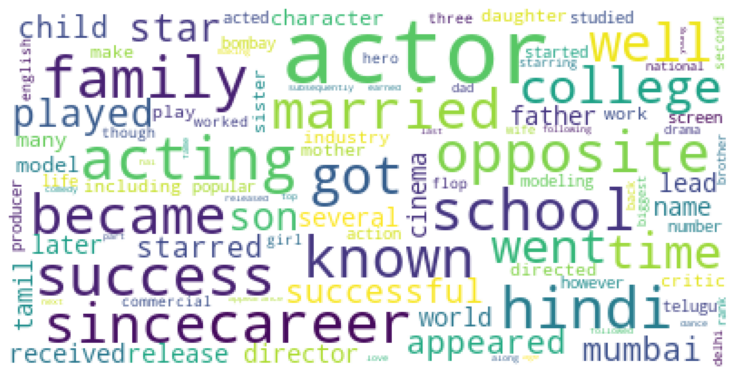

MemoryError: In RendererAgg: Out of memory

In [132]:
wordcloud = WordCloud(
                          background_color='white',
                          stopwords=stop_words,
                          max_words=100,
                          max_font_size=50, 
                          random_state=42
                         ).generate(str(corpus))
print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()
fig.savefig("word1.png", dpi=900)

In [133]:
cv=CountVectorizer(max_df=0.8,stop_words=stop_words, max_features=10000, ngram_range=(1,3))
X=cv.fit_transform(corpus)

c:\users\amanj\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\feature_extraction\text.py:382: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['atul', 'ehsaan', 'loy', 'shekhar', 'souza', 'vishal'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


In [134]:
list(cv.vocabulary_.keys())[:10]

['doubt',
 'dedicated',
 'actor',
 'world',
 'recent',
 'success',
 'china',
 'market',
 'got',
 'title']

In [135]:
#Most frequently occuring words
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in      
                   vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                       reverse=True)
    return words_freq[:n]

In [136]:
#Convert most freq words to dataframe for plotting bar plot
top_words = get_top_n_words(corpus, n=20)
top_df = pd.DataFrame(top_words)
top_df.columns=["Word", "Freq"]

[Text(0, 0, 'actor'),
 Text(0, 0, 'film'),
 Text(0, 0, 'movie'),
 Text(0, 0, 'known'),
 Text(0, 0, 'career'),
 Text(0, 0, 'star'),
 Text(0, 0, 'school'),
 Text(0, 0, 'success'),
 Text(0, 0, 'acting'),
 Text(0, 0, 'family'),
 Text(0, 0, 'went'),
 Text(0, 0, 'opposite'),
 Text(0, 0, 'got'),
 Text(0, 0, 'well'),
 Text(0, 0, 'hindi'),
 Text(0, 0, 'celebrity'),
 Text(0, 0, 'child'),
 Text(0, 0, 'married'),
 Text(0, 0, 'tamil'),
 Text(0, 0, 'became')]

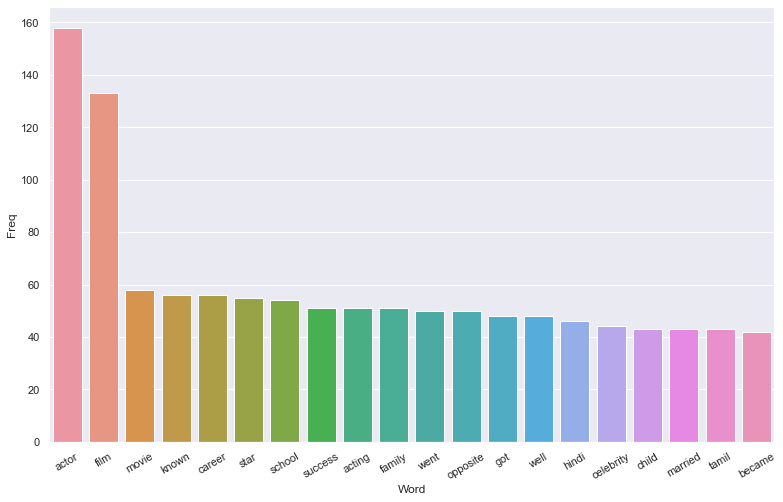

In [137]:
#Barplot of most freq words
sns.set(rc={'figure.figsize':(13,8)})
g = sns.barplot(x="Word", y="Freq", data=top_df)
g.set_xticklabels(g.get_xticklabels(), rotation=30)

                    Bi-gram  Freq
0          forbes celebrity    26
1          critical acclaim    12
2      critically acclaimed    10
3             miss universe    10
4          highest grossing     9
5           successful film     9
6                well known     9
7            started career     9
8               action hero     9
9             social medium     9
10            uttar pradesh     8
11              music video     8
12             crowned miss     8
13          younger brother     8
14             highest paid     8
15                  co star     8
16              went become     7
17             next release     7
18         brand ambassador     7
19  commercially successful     7


[Text(0, 0, 'forbes celebrity'),
 Text(0, 0, 'critical acclaim'),
 Text(0, 0, 'critically acclaimed'),
 Text(0, 0, 'miss universe'),
 Text(0, 0, 'highest grossing'),
 Text(0, 0, 'successful film'),
 Text(0, 0, 'well known'),
 Text(0, 0, 'started career'),
 Text(0, 0, 'action hero'),
 Text(0, 0, 'social medium'),
 Text(0, 0, 'uttar pradesh'),
 Text(0, 0, 'music video'),
 Text(0, 0, 'crowned miss'),
 Text(0, 0, 'younger brother'),
 Text(0, 0, 'highest paid'),
 Text(0, 0, 'co star'),
 Text(0, 0, 'went become'),
 Text(0, 0, 'next release'),
 Text(0, 0, 'brand ambassador'),
 Text(0, 0, 'commercially successful')]

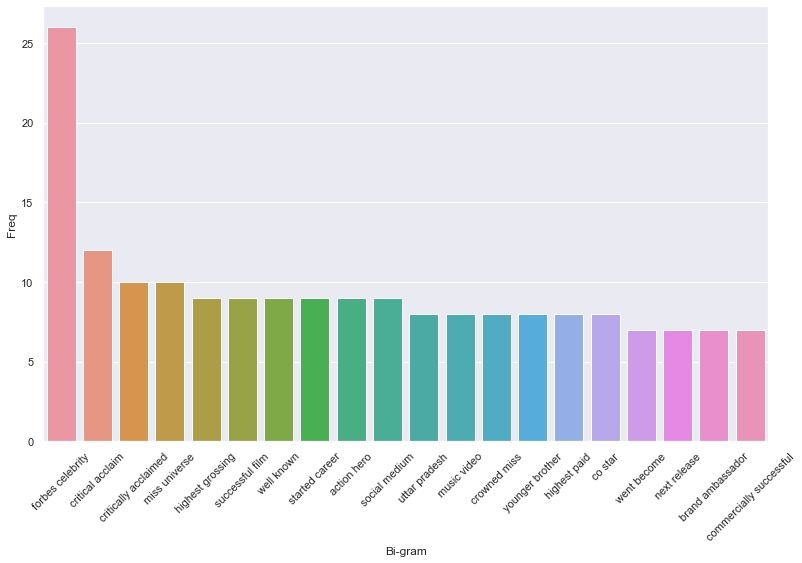

In [138]:
#Most frequently occuring Bi-grams
def get_top_n2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2),  
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]
top2_words = get_top_n2_words(corpus, n=20)
top2_df = pandas.DataFrame(top2_words)
top2_df.columns=["Bi-gram", "Freq"]
print(top2_df)
#Barplot of most freq Bi-grams
import seaborn as sns
sns.set(rc={'figure.figsize':(13,8)})
h=sns.barplot(x="Bi-gram", y="Freq", data=top2_df)
h.set_xticklabels(h.get_xticklabels(), rotation=45)

                            Tri-gram  Freq
0                     dil chahta hai     5
1                    ram gopal varma     5
2              rank forbes celebrity     5
3       commercially successful film     4
4              forbes celebrity rank     4
5                       om shanti om     4
6           bombay maharashtra actor     4
7              dharm adhikari kanoon     4
8               adhikari kanoon apna     4
9                   kanoon apna apna     4
10                social medium fame     4
11            highest civilian honor     3
12                     gadar ek prem     3
13                     ek prem katha     3
14  critically acclaimed performance     3
15                     back back hit     3
16            bombay scottish school     3
17               continues act movie     3
18               yamla pagla deewana     3
19           return forbes celebrity     3


[Text(0, 0, 'dil chahta hai'),
 Text(0, 0, 'ram gopal varma'),
 Text(0, 0, 'rank forbes celebrity'),
 Text(0, 0, 'commercially successful film'),
 Text(0, 0, 'forbes celebrity rank'),
 Text(0, 0, 'om shanti om'),
 Text(0, 0, 'bombay maharashtra actor'),
 Text(0, 0, 'dharm adhikari kanoon'),
 Text(0, 0, 'adhikari kanoon apna'),
 Text(0, 0, 'kanoon apna apna'),
 Text(0, 0, 'social medium fame'),
 Text(0, 0, 'highest civilian honor'),
 Text(0, 0, 'gadar ek prem'),
 Text(0, 0, 'ek prem katha'),
 Text(0, 0, 'critically acclaimed performance'),
 Text(0, 0, 'back back hit'),
 Text(0, 0, 'bombay scottish school'),
 Text(0, 0, 'continues act movie'),
 Text(0, 0, 'yamla pagla deewana'),
 Text(0, 0, 'return forbes celebrity')]

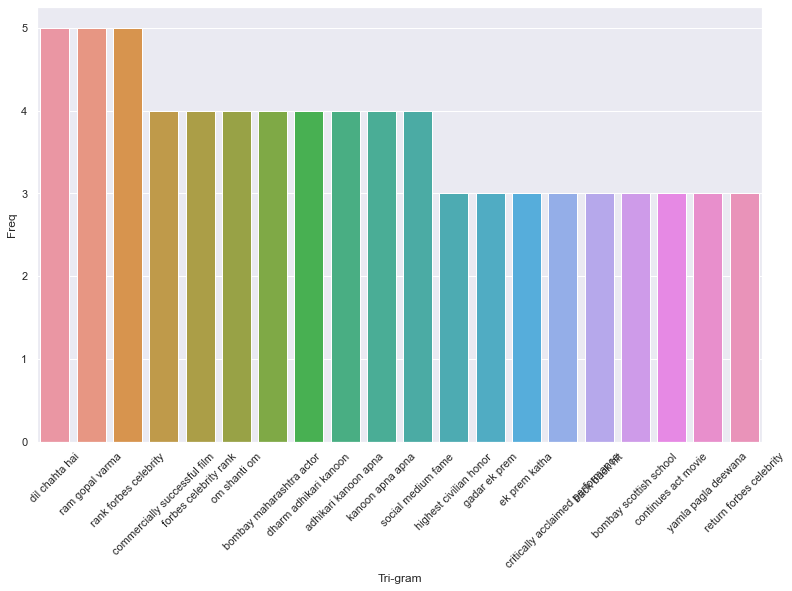

In [139]:
#Most frequently occuring Tri-grams
def get_top_n3_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(3,3), 
           max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]
top3_words = get_top_n3_words(corpus, n=20)
top3_df = pandas.DataFrame(top3_words)
top3_df.columns=["Tri-gram", "Freq"]
print(top3_df)
#Barplot of most freq Tri-grams
import seaborn as sns
sns.set(rc={'figure.figsize':(13,8)})
j=sns.barplot(x="Tri-gram", y="Freq", data=top3_df)
j.set_xticklabels(j.get_xticklabels(), rotation=45)

In [140]:
tfidf_transformer=TfidfTransformer(smooth_idf=True,use_idf=True)
tfidf_transformer.fit(X)

TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True)

In [141]:
def sort_coo(coo_matrix):
    tuples = zip(coo_matrix.col, coo_matrix.data)
    return sorted(tuples, key=lambda x: (x[1], x[0]), reverse=True)

In [142]:
def extract_topn_from_vector(feature_names, sorted_items, topn=10):
    """get the feature names and tf-idf score of top n items"""
    
    #use only topn items from vector
    sorted_items = sorted_items[:topn]
 
    score_vals = []
    feature_vals = []
    
    # word index and corresponding tf-idf score
    for idx, score in sorted_items:
        
        #keep track of feature name and its corresponding score
        score_vals.append(round(score, 3))
        feature_vals.append(feature_names[idx])
 
    #create a tuples of feature,score
    #results = zip(feature_vals,score_vals)
    results= {}
    for idx in range(len(feature_vals)):
        results[feature_vals[idx]]=score_vals[idx]
    
    return results

In [161]:
attributes = []
for i in range(0,174):
    # get feature names
    feature_names=cv.get_feature_names()
 
    # fetch document for which keywords needs to be extracted
    doc=corpus[i]
 
    #generate tf-idf for the given document
    tf_idf_vector=tfidf_transformer.transform(cv.transform([doc]))
    
    #sort the tf-idf vectors by descending order of scores
    sorted_items=sort_coo(tf_idf_vector.tocoo())
    #extract only the top n; n here is 10
    keywords=extract_topn_from_vector(feature_names,sorted_items,14)
    
    attributes.append(df["name"][i])
    attributes[i] = []
    for k in keywords:
        attributes[i].append(k)

In [122]:
df.head()

,Unnamed: 0,Unnamed: 0.1,name,born,nickname,height,img_x,birth name,img_y,rank,bio,word_count,attributes
0,0,0,Aamir Khan,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",https://m.media-amazon.com/images/M/MV5BMjAwMj...,NaN,https://www.forbesindia.com/media/celeblist201...,15.0,Aamir is no doubt one of the most dedicated ac...,751,"[aamir, movie like, film, like, ghajini, china..."
1,1,1,Madhuri Dixit,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BNTk0OT...,Madhuri Shankar Dixit,NaN,-1.0,Madhuri Dixit is one of the most acclaimed act...,1253,"[dixit, filmfare best actress, actress award, ..."
2,2,2,Manisha Koirala,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BMjMwMD...,Manisha P. Koirala,NaN,-1.0,Manisha Koirala (born 16 August 1970) is a Nep...,522,"[woman, manisha, koirala, several, actress, be..."
3,3,3,Shriya Saran,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)",https://m.media-amazon.com/images/M/MV5BMTk4MD...,Shriya Saran Bhatnagar,NaN,-1.0,"Shriya Saran also known by the mononym Shriya,...",207,"[saran, film, tamil film, tamil, shriya, indus..."
4,4,4,Abhay Deol,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)",https://m.media-amazon.com/images/M/MV5BMTU2Nz...,NaN,NaN,-1.0,"Abhay Deol (born in 1976, India) is an Indian ...",87,"[deol, abhay, actor, film, opposite ayesha tak..."


In [163]:
df.drop(['Unnamed: 0' , 'Unnamed: 0.1'] , axis =1)

,Unnamed: 0.1.1,name,born,nickname,height,img_x,birth name,img_y,rank,bio,word_count,attributes
0,0,Aamir Khan,"March 14, \n \n1965 \n \nin Bombay, Ma...",Mr. Perfectionist\nTom Hanks of India\nAce of ...,"5' 4"" (1.62 m)",https://m.media-amazon.com/images/M/MV5BMjAwMj...,NaN,https://www.forbesindia.com/media/celeblist201...,15.0,Aamir is no doubt one of the most dedicated ac...,751,"['aamir', 'movie like', 'film', 'like', 'ghaji..."
1,1,Madhuri Dixit,"May 15, \n \n1967 \n \nin Bombay, Maha...",Bubbly\nDhak Dhak Girl\nMohini,"5' 2½"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BNTk0OT...,Madhuri Shankar Dixit,NaN,-1.0,Madhuri Dixit is one of the most acclaimed act...,1253,"['dixit', 'filmfare best actress', 'actress aw..."
2,2,Manisha Koirala,"August 16, \n \n1970 \n \nin Kathmandu...",NaN,"5' 2"" (1.58 m)",https://m.media-amazon.com/images/M/MV5BMjMwMD...,Manisha P. Koirala,NaN,-1.0,Manisha Koirala (born 16 August 1970) is a Nep...,522,"['woman', 'manisha', 'koirala', 'several', 'ac..."
3,3,Shriya Saran,"September 11, \n \n1982 \n \nin Dehra ...",NaN,"5' 4½"" (1.64 m)",https://m.media-amazon.com/images/M/MV5BMTk4MD...,Shriya Saran Bhatnagar,NaN,-1.0,"Shriya Saran also known by the mononym Shriya,...",207,"['saran', 'film', 'tamil film', 'tamil', 'shri..."
4,4,Abhay Deol,"March 15, \n \n1976 \n \nin Chandigarh...",NaN,"5' 10¾"" (1.8 m)",https://m.media-amazon.com/images/M/MV5BMTU2Nz...,NaN,NaN,-1.0,"Abhay Deol (born in 1976, India) is an Indian ...",87,"['deol', 'abhay', 'actor', 'film', 'opposite a..."
...,...,...,...,...,...,...,...,...,...,...,...,...
169,169,Ranveer Brar,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,96.0,Ranveer Brar is the second-highest earning ce...,19,"['popular travel led', 'popular travel', 'list..."
170,170,Vikas Khanna,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,97.0,Best known for his Michelin-starred Manhattan...,20,"['michelin starred manhattan', 'michelin starr..."
171,171,Rohan Bopanna,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,98.0,Bopanna has had an active 2018-19 playing sev...,17,"['playing several grand', 'playing several', '..."
172,172,Vicky Ratnani,NaN,NaN,NaN,NaN,NaN,https://www.forbesindia.com/media/celeblist201...,99.0,"With web series Vicky the Gastronaut, Chef Vi...",20,"['vicky', 'web series', 'web', 'list year', 'c..."


In [165]:
df = df.drop(['Unnamed: 0','Unnamed: 0.1' , 'Unnamed: 0.1.1'] , axis =1)

In [166]:
df.to_csv('final2_full.csv') 

In [2]:
df = pd.read_csv("final2_full.csv")

Name: Aamir Khan


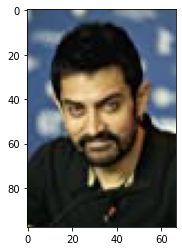

Attributes: ['aamir', 'movie like', 'film', 'like', 'ghajini', 'china', 'box office', 'box', 'office', 'first', 'idiot', 'highest', 'record', 'crore'] 
Born: March 14, 
     
1965    
  
in Bombay, Maharashtra, India

Nickname: Mr. Perfectionist
Tom Hanks of India
Ace of Bollywood
Ace Khan
Mr. Perfect

Height:  5' 4" (1.62 m)

Birth Name: nan

Rank: 15.0

-----------------------------------------------

Name: Madhuri Dixit


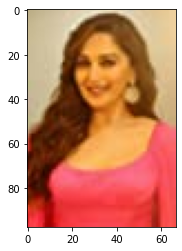

Attributes: ['dixit', 'filmfare best actress', 'actress award', 'best actress award', 'best actress', 'filmfare best', 'madhuri', 'filmfare', 'film', 'best', 'opposite', 'nomination filmfare best', 'nomination filmfare', 'award'] 
Born: May 15, 
     
1967    
  
in Bombay, Maharashtra, India

Nickname: Bubbly
Dhak Dhak Girl
Mohini

Height:  5' 2½" (1.58 m)

Birth Name: Madhuri Shankar Dixit

Rank: -1.0

-----------------------------------------------

Name: Manisha Koirala


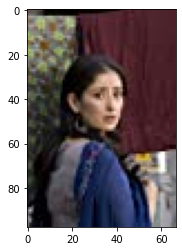

Attributes: ['woman', 'manisha', 'koirala', 'several', 'actress', 'best actress', 'award best actress', 'film', 'award', 'received appreciation', 'prevention', 'akele', 'well', 'award best'] 
Born: August 16, 
     
1970    
  
in Kathmandu, Nepal

Nickname: nan

Height:  5' 2" (1.58 m)

Birth Name: Manisha P. Koirala

Rank: -1.0

-----------------------------------------------

Name: Shriya Saran


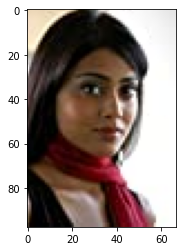

Attributes: ['saran', 'film', 'tamil film', 'tamil', 'shriya', 'industry saran', 'film industry saran', 'telugu', 'industry', 'hindi tamil', 'telugu film', 'indian', 'hindi', 'production'] 
Born: September 11, 
     
1982    
  
in Dehra Dun, Uttar Pradesh, India

Nickname: nan

Height:  5' 4½" (1.64 m)

Birth Name: Shriya Saran Bhatnagar

Rank: -1.0

-----------------------------------------------

Name: Abhay Deol


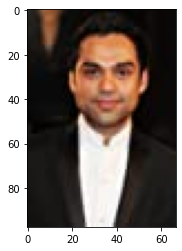

Attributes: ['deol', 'abhay', 'actor', 'film', 'opposite ayesha takia', 'opposite ayesha', 'nephew famous veteran', 'nephew famous', 'mumbai university abhay', 'mumbai university', 'los angeles studied', 'sunny deol bobby', 'los angeles', 'los'] 
Born: March 15, 
     
1976    
  
in Chandigarh, Punjab, India

Nickname: nan

Height:  5' 10¾" (1.8 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Ajay Devgn


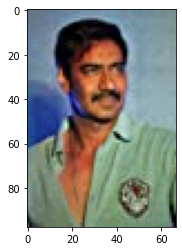

Attributes: ['devgn', 'film', 'golmaal', 'singham', 'bhagat singh', 'bhagat', 'best', 'award best', 'fun', 'ajay devgn', 'award best actor', 'film award best', 'national film award', 'national film'] 
Born: April 2, 
     
1969    
  
in New Delhi, India

Nickname: nan

Height:  5' 7½" (1.71 m)

Birth Name: Vishal Veeru Devgan

Rank: 12.0

-----------------------------------------------

Name: Rajinikanth


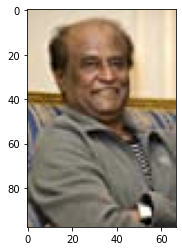

Attributes: ['movie', 'considered', 'megastar', 'performance movie', 'tamil', 'padma', 'tamil movie', 'art', 'performance', 'action', 'back', 'actor', 'film', 'rajinikanth megastar tamil'] 
Born: December 12, 
     
1950    
  
in Bangalore, Mysore State, India

Nickname: Superstar
Thalaivar

Height:  5' 7" (1.7 m)

Birth Name: Shivaji Rao Gaekwad

Rank: 13.0

-----------------------------------------------

Name: Nawazuddin Siddiqui


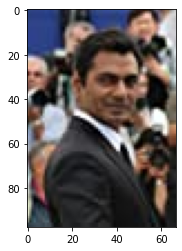

Attributes: ['nawazuddin', 'siddiqui', 'film', 'wasseypur', 'gang wasseypur', 'role', 'gang', 'nawazuddin siddiqui', 'film festival', 'festival', 'khan', 'short', 'cannes film festival', 'cannes film'] 
Born: May 19, 
     
1974    
  
in Budhana, Muzaffarnagar, Uttar Pradesh, India

Nickname: nan

Height:  5' 2" (1.58 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Parineeti Chopra


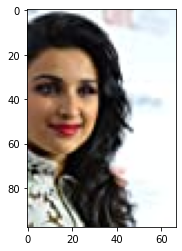

Attributes: ['chopra', 'ambala', 'parineeti chopra', 'parineeti', 'investment', 'actress', 'nomination', 'best', 'filmfare award best', 'singer', 'award', 'business', 'filmfare award', 'comedy'] 
Born: nan

Nickname: Pari
Tisha
PC Junior

Height:  5' 3" (1.6 m)

Birth Name: nan

Rank: 41.0

-----------------------------------------------

Name: Zareen Khan


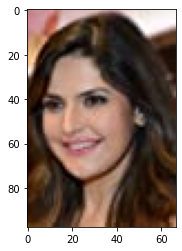

Attributes: ['khan', 'princess', 'quite small assignment', 'quite small', 'princess yashodhara gained', 'princess yashodhara', 'pathan family mumbai', 'pathan family', 'pathan', 'order convincing th', 'order convincing', 'noticed decided cast', 'noticed decided', 'muslim pathan family'] 
Born: May 14, 
     
1987    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 5" (1.65 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Mahie Gill


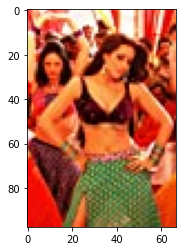

Attributes: ['gill', 'chandigarh', 'punjabi', 'punjabi film along', 'punjabi film', 'punjabi based bollywood', 'punjabi based', 'punjab completed master', 'punjab completed', 'play character paro', 'party instantly finalized', 'party instantly', 'paro movie dev', 'paro movie'] 
Born: December 19, 
     
1975    
  
in Chandigarh, India

Nickname: nan

Height:  5' 2" (1.58 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Ali Zafar


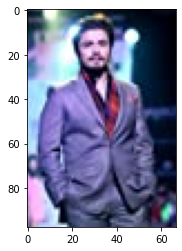

Attributes: ['pakistan', 'ali', 'actor pakistan', 'mainstream', 'ali zafar', 'music', 'zafar', 'global', 'etc', 'cola', 'asian', 'feature', 'actor', 'shahrukh khan'] 
Born: May 18, 
     
1980    
  
in Lahore, Punjab, Pakistan

Nickname: nan

Height:  5' 9" (1.75 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Arjun Rampal


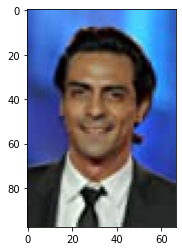

Attributes: ['arjun', 'rampal', 'arjun rampal', 'rajiv', 'cast', 'arjun part', 'rock', 'om', 'video', 'music video', 'part', 'acclaim', 'national', 'delhi'] 
Born: November 26, 
     
1972    
  
in Jabalpur, Madhya Pradesh, India

Nickname: nan

Height:  5' 11½" (1.81 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Shreyas Talpade


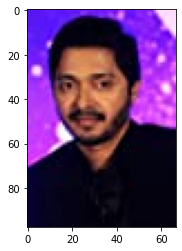

Attributes: ['om', 'om iqbal dor', 'om iqbal', 'talpade', 'shreyas talpade', 'shreyas', 'actor director known', 'director known', 'shanti om', 'shanti', 'om shanti om', 'om shanti', 'maharashtra india actor', 'born january'] 
Born: January 27, 
     
1976    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 7" (1.7 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Vinay Pathak


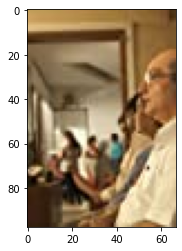

Attributes: ['pathak born july', 'pathak born', 'rab ne bana', 'rab ne', 'rab', 'pathak', 'ne bana di', 'ne bana', 'ne', 'name khan', 'di jodi', 'bihar india', 'bihar', 'bana di jodi'] 
Born: July 12, 
     
1968    
  
in Bhojpur District, Bihar, India

Nickname: nan

Height:  nan

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Bipasha Basu


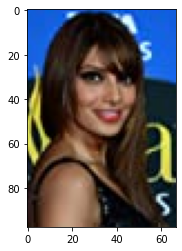

Attributes: ['bipasha', 'ford supermodel', 'ford', 'dark', 'commerce', 'name', 'bengali', 'supermodel', 'ended', 'dhoom', 'miss', 'subsequently', 'th', 'sister'] 
Born: January 7, 
     
1979    
  
in Delhi, India

Nickname: Bonny
Bips
Bippy
Bipsy

Height:  5' 5" (1.65 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Ayushmann Khurrana


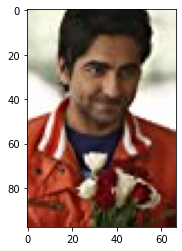

Attributes: ['ayushmann', 'chandigarh', 'khurrana', 'theatre', 'dav college', 'vicky donor', 'donor', 'dav', 'communication', 'ayushmann khurrana', 'highly', 'vicky', 'punjab', 'college'] 
Born: September 14, 
     
1984    
  
in Chandigarh, Punjab, India

Nickname: nan

Height:  5' 6¼" (1.68 m)

Birth Name: nan

Rank: 37.0

-----------------------------------------------

Name: John Abraham


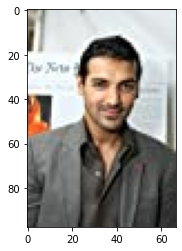

Attributes: ['john', 'abraham', 'christian', 'name', 'syrian christian', 'syrian', 'parsi', 'manhunt', 'gladrags manhunt', 'father', 'gladrags', 'kerala', 'mumbai', 'came'] 
Born: December 17, 
     
1972    
  
in Kochi, Kerala, India

Nickname: nan

Height:  5' 11½" (1.82 m)

Birth Name: Farhan Abraham

Rank: 46.0

-----------------------------------------------

Name: Karisma Kapoor


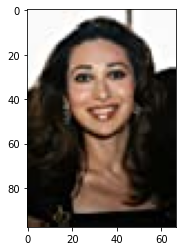

Attributes: ['tandon', 'raveena tandon', 'raveena', 'raja', 'hit', 'big', 'time', 'kapoor', 'range depth', 'raja hindustani consolidated', 'raja hindustani', 'raja babu ending', 'qaidi opposite harish', 'qaidi opposite'] 
Born: June 25, 
     
1974    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 4" (1.63 m)

Birth Name: Karisma Randhir Kapoor

Rank: -1.0

-----------------------------------------------

Name: Hema Malini


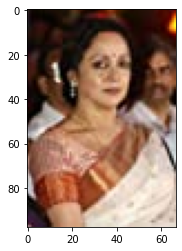

Attributes: ['hema', 'dharmendra', 'marriage', 'pair', 'movie', 'rajesh khanna', 'rajesh', 'tamil', 'flop', 'hit', 'hindu', 'khanna', 'act', 'venniradai'] 
Born: October 16, 
     
1948    
  
in Jeeyapuram, Tiruchirappalli district, Madras State, India

Nickname: nan

Height:  5' 4" (1.63 m)

Birth Name: Hema Malini R. Chakravarty

Rank: -1.0

-----------------------------------------------

Name: Tabu


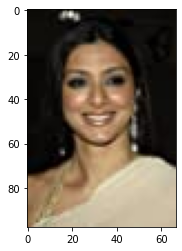

Attributes: ['film', 'american film', 'tabu', 'indian actress', 'tu', 'american', 'best', 'actress', 'award', 'award best', 'praise regarded talented', 'praise regarded', 'performer four exception', 'performer four'] 
Born: November 4, 
     
1970    
  
in Hyderabad, Andhra Pradesh, India

Nickname: nan

Height:  5' 6¼" (1.69 m)

Birth Name: Tabassum Fatima Hashmi

Rank: -1.0

-----------------------------------------------

Name: Mallika Sherawat


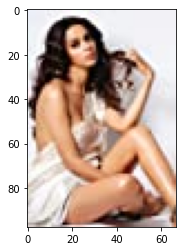

Attributes: ['october rohtak haryana', 'october rohtak', 'myth maan gaye', 'myth maan', 'myth', 'murder myth maan', 'murder myth', 'mughall azam married', 'mughall azam', 'mughall', 'married karan singh', 'married karan', 'mallika sherawat born', 'mallika sherawat'] 
Born: October 24, 
     
1976    
  
in Rohtak, Haryana, India

Nickname: nan

Height:  5' 4¾" (1.64 m)

Birth Name: Reema Lambha

Rank: -1.0

-----------------------------------------------

Name: Neil Nitin Mukesh


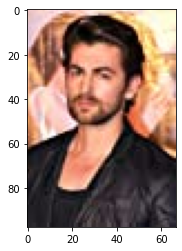

Attributes: ['karni', 'jaise karni', 'jaise', 'bharni', 'govinda', 'child', 'childhood', 'movie', 'father', 'college', 'raj movie vijay', 'raj movie', 'played role govinda', 'people would expected'] 
Born: January 15, 
     
1982    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 6" (1.68 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Sunny Deol


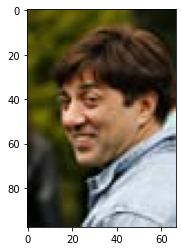

Attributes: ['sunny', 'deol', 'film', 'major success', 'brother bobby', 'remarkable', 'ghayal', 'acted', 'among others', 'hit film', 'go', 'dharmendra', 'bobby', 'among'] 
Born: October 19, 
     
1957    
  
in Sahnewal, Ludhiana, Punjab, India

Nickname: nan

Height:  5' 7½" (1.71 m)

Birth Name: Ajay Singh Deol

Rank: -1.0

-----------------------------------------------

Name: Arjun Kapoor


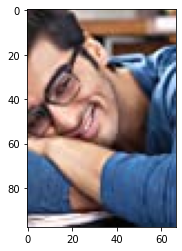

Attributes: ['quotient', 'old actor return', 'old actor', 'scoring high fame', 'list scoring high', 'list scoring', 'kapoor born', 'ishaqzaade', 'celebrity list scoring', 'assistant director', 'scoring high', 'return forbes india', 'return forbes', 'director known'] 
Born: June 26, 
     
1985    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 10" (1.78 m)

Birth Name: nan

Rank: 65.0

-----------------------------------------------

Name: Genelia D'Souza


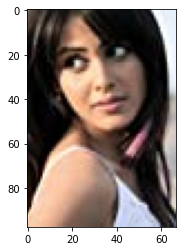

Attributes: ['souza', 'telugu', 'bommarillu', 'tamil', 'mobile', 'jaane', 'established', 'acting', 'film', 'movie', 'several', 'perk india', 'performance telugu romantic', 'performance telugu'] 
Born: August 5, 
     
1987    
  
in Bombay, Maharashtra, India

Nickname: Teenage Superstar of Bollywood
Cheenu
Geenu

Height:  5' 4" (1.63 m)

Birth Name: Genelia De Souza

Rank: -1.0

-----------------------------------------------

Name: Anushka Sharma


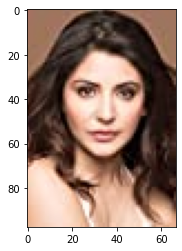

Attributes: ['sharma', 'anushka', 'film', 'yash raj', 'army', 'yash', 'raj', 'rodricks', 'patiala house', 'patiala', 'modeling career', 'karnesh', 'army officer', 'anushka sharma'] 
Born: May 1, 
     
1988    
  
in Bangalore, Karnataka, India

Nickname: nan

Height:  5' 6" (1.68 m)

Birth Name: nan

Rank: 21.0

-----------------------------------------------

Name: Katrina Kaif


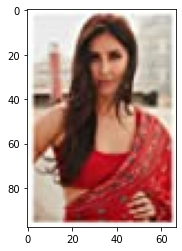

Attributes: ['katrina', 'culture', 'movie', 'state', 'dancing', 'bollywood', 'movie boom', 'malliswari', 'katrina kaif', 'kaif', 'hawaii', 'gorgeous look', 'gorgeous', 'caucasian'] 
Born: July 16, 
     
1984    
  
in Hong Kong

Nickname: nan

Height:  5' 6" (1.68 m)

Birth Name: nan

Rank: 23.0

-----------------------------------------------

Name: Madhavan


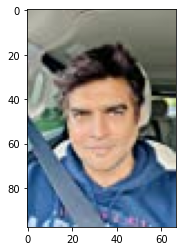

Attributes: ['english hindi tamil', 'english hindi', 'deal', 'hindi tamil', 'tamil', 'air', 'year later', 'army', 'ambassador', 'speaking', 'english', 'later', 'college', 'public speaking met'] 
Born: June 1, 
     
1970    
  
in Jamshedpur, Bihar, India

Nickname: nan

Height:  5' 8" (1.73 m)

Birth Name: Madhavan Ranganathan

Rank: -1.0

-----------------------------------------------

Name: Jacqueline Fernandez


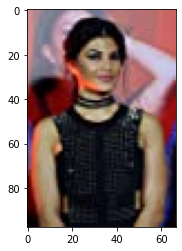

Attributes: ['sri', 'lanka', 'sri lanka', 'miss', 'movie', 'sydney', 'sri lankan', 'miss sri lanka', 'miss sri', 'lankan', 'lanka business', 'bahrain', 'riteish deshmukh', 'riteish'] 
Born: June 2, 
     
1985    
  
in Colombo, Sri Lanka

Nickname: nan

Height:  5' 4" (1.63 m)

Birth Name: Jacqueline Fernandez

Rank: 32.0

-----------------------------------------------

Name: Naseeruddin Shah


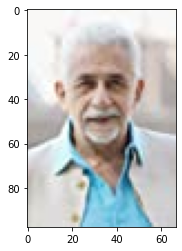

Attributes: ['shah', 'pradesh india actor', 'pathak shah since', 'pathak shah', 'naseeruddin shah born', 'married ratna pathak', 'married ratna', 'league extraordinary gentleman', 'league extraordinary', 'uttar pradesh india', 'ratna', 'pathak', 'naseeruddin shah', 'naseeruddin'] 
Born: July 20, 
     
1950    
  
in Barabanki, Uttar Pradesh, India

Nickname: nan

Height:  5' 10" (1.78 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Manoj Bajpayee


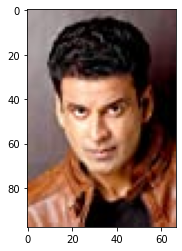

Attributes: ['neha since february', 'neha since', 'married neha since', 'married neha', 'manoj bajpayee born', 'wasseypur', 'since february', 'satya', 'manoj bajpayee', 'gang wasseypur', 'born april', 'bihar india', 'bihar', 'bajpayee'] 
Born: April 23, 
     
1969    
  
in Belwa, Bihar, India

Nickname: nan

Height:  5' 7" (1.7 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Imran Khan


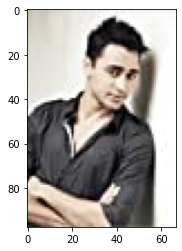

Attributes: ['imran khan', 'imran', 'jaane', 'january', 'pal actor director', 'pal actor', 'na delhi belly', 'na delhi', 'married avantika malik', 'married avantika', 'malik since january', 'malik since', 'madison wisconsin usa', 'madison wisconsin'] 
Born: January 13, 
     
1983    
  
in Madison, Wisconsin, USA

Nickname: nan

Height:  5' 7½" (1.71 m)

Birth Name: Imran Khan Pal

Rank: -1.0

-----------------------------------------------

Name: Minissha Lamba


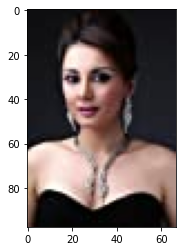

Attributes: ['delhi', 'cadbury', 'act', 'modeling', 'successful', 'punjabi speaking sikh', 'popular include corporate', 'popular include', 'name minissha since', 'name minissha', 'nadu well srinagar', 'nadu well', 'mumbai starred dozen', 'mumbai starred'] 
Born: January 18, 
     
1985    
  
in India

Nickname: nan

Height:  5' 2" (1.57 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Asin Thottumkal


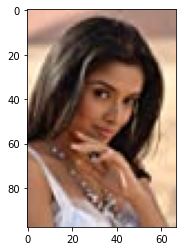

Attributes: ['asin', 'telugu', 'obtaining', 'tamil', 'theresa', 'st theresa', 'higher secondary school', 'higher secondary', 'enrolled st theresa', 'dad', 'secondary school', 'secondary', 'higher', 'enrolled st'] 
Born: October 26, 
     
1985    
  
in Cochin, Kerala, India

Nickname: nan

Height:  5' 2" (1.58 m)

Birth Name: Asin Thottumkal

Rank: -1.0

-----------------------------------------------

Name: Akshay Kumar


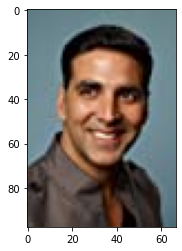

Attributes: ['khiladi', 'mr', 'martial art', 'martial', 'bond', 'art', 'pooja batra rekha', 'pooja batra', 'pooja', 'performance saugandh well', 'performance saugandh', 'performance include airlift', 'paid celebrity', 'offered film along'] 
Born: September 9, 
     
1967    
  
in Amritsar, Punjab, India

Nickname: Akki
Mac
Khiladi
Khiladi Kumar

Height:  5' 10" (1.78 m)

Birth Name: Rajiv Hari Om-Bhatia

Rank: 2.0

-----------------------------------------------

Name: Sushmita Sen


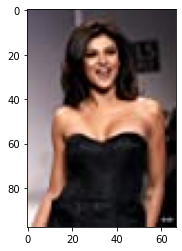

Attributes: ['air force', 'air', 'miss', 'force', 'sushmita', 'renee', 'adopt', 'beauty', 'subhra', 'ironically', 'named', 'finally', 'dubai', 'could'] 
Born: November 19, 
     
1975    
  
in Hyderabad, Andhra Pradesh, India

Nickname: Titu
Sush

Height:  5' 7½" (1.71 m)

Birth Name: Sushmita Shubeer Sen

Rank: -1.0

-----------------------------------------------

Name: Farhan Akhtar


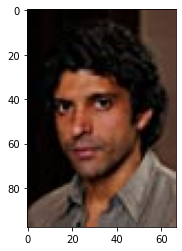

Attributes: ['farhan', 'best', 'film', 'writer', 'award best', 'award', 'writer director', 'national award best', 'feature film', 'national award', 'feature', 'filmfare award best', 'director', 'milkha'] 
Born: January 9, 
     
1974    
  
in Mumbai, India

Nickname: nan

Height:  5' 7" (1.7 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Sunny Leone


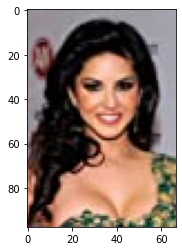

Attributes: ['sunny', 'leone', 'adult', 'sunny leone', 'film', 'penthouse pet', 'penthouse', 'canadian', 'adult film', 'pet', 'high', 'jism', 'addition', 'praise'] 
Born: May 13, 
     
1981    
  
in Sarnia, Ontario, Canada

Nickname: nan

Height:  5' 4" (1.63 m)

Birth Name: Karenjit Kaur Vohra

Rank: 48.0

-----------------------------------------------

Name: Amitabh Bachchan


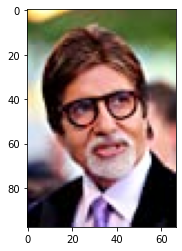

Attributes: ['bachchan', 'abhishek', 'amitabh', 'shweta', 'mr', 'jaya', 'rajiv', 'gandhi', 'bollywood', 'rajiv gandhi', 'kaun banega crorepati', 'kaun banega', 'crorepati', 'congress'] 
Born: October 11, 
     
1942    
  
in Allahabad, United Provinces, British India [now Uttar Pradesh, India]

Nickname: Big B
Munna
Angry Young Man
Bollywood's Shahenshah
Amith
AB Sr.
One Man Industry
Superstar of the Millenium
The Last Emperor
Mahanayak
Amit ji

Height:  6' (1.83 m)

Birth Name: Amitabh Harivansh Srivastav

Rank: 4.0

-----------------------------------------------

Name: Chitrangda Singh


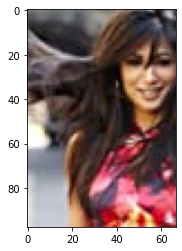

Attributes: ['chitrangda', 'smita patil', 'patil', 'chitrangda singh', 'smita', 'singh', 'film', 'randhawa made film', 'randhawa made', 'randhawa', 'prior making transition', 'prior making', 'popular brand like', 'popular brand'] 
Born: March 28, 
     
1976    
  
in Meerut, India

Nickname: nan

Height:  5' 2¼" (1.58 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Jaaved Jaffery
No image
Attributes: ['actor known', 'known', 'actor'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Ameesha Patel


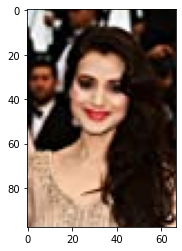

Attributes: ['amisha', 'patel', 'pyaar', 'three letter', 'thoda', 'pyaar hai', 'prem katha', 'naa pyaar hai', 'naa pyaar', 'letter', 'kaho naa pyaar', 'kaho naa', 'kaho', 'gadar ek prem'] 
Born: June 9, 
     
1975    
  
in Bombay, Maharashtra, India

Nickname: Princess
Angel
Amypoo
Amu

Height:  5' (1.52 m)

Birth Name: Amisha Patel

Rank: -1.0

-----------------------------------------------

Name: Vivek Oberoi


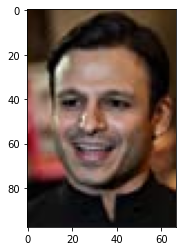

Attributes: ['vivek', 'gangster', 'varma', 'company', 'opposite', 'recently got', 'big', 'oberoi', 'thought', 'ram gopal varma', 'ram gopal', 'gopal varma', 'gopal', 'road'] 
Born: September 3, 
     
1976    
  
in Hyderabad, Andhra Pradesh, India

Nickname: nan

Height:  5' 9" (1.75 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Sonu Sood


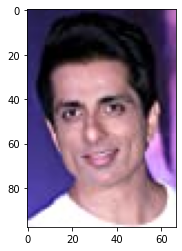

Attributes: ['raised nagpur sister', 'raised nagpur', 'punjab raised nagpur', 'punjab raised', 'pashupathy fantasy telugu', 'pashupathy fantasy', 'pashupathy', 'nagpur sister engineering', 'nagpur sister', 'moga punjab raised', 'moga punjab', 'moga', 'may entrepreneur teacher', 'may entrepreneur'] 
Born: July 30, 
     
1973    
  
in Moga, Punjab, India

Nickname: nan

Height:  6' 0¾" (1.85 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Rajeev Khandelwal


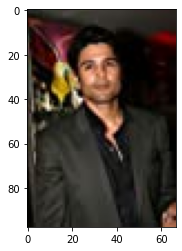

Attributes: ['khandelwal', 'aamir', 'left', 'television', 'rajveer singh shekhawat', 'rajveer singh', 'rajveer', 'rajeev khandelwal indian', 'rajeev khandelwal', 'played vivaan agasthi', 'played vivaan', 'notable character dr', 'notable character', 'national geographic channel'] 
Born: October 16, 
     
1975    
  
in Jaipur, Rajasthan, India

Nickname: nan

Height:  5' 5¾" (1.67 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Emraan Hashmi


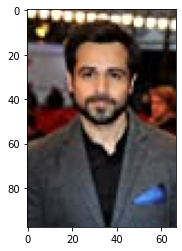

Attributes: ['hashmi', 'thriller', 'crime', 'drama', 'jannat', 'horror', 'crime thriller', 'actor hindi cinema', 'actor hindi', 'successful', 'murder', 'hindi cinema', 'received', 'nomination'] 
Born: March 24, 
     
1979    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 6" (1.68 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Hrithik Roshan


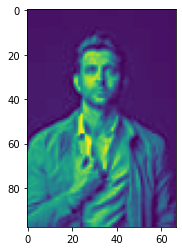

Attributes: ['hrithik', 'roshan', 'film', 'hrithik roshan', 'actor', 'award', 'action', 'immense', 'akbar', 'role', 'received', 'playing', 'best actor', 'set'] 
Born: January 10, 
     
1974    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 9" (1.75 m)

Birth Name: Hrithik Rakesh Nagrath

Rank: 18.0

-----------------------------------------------

Name: Neha Dhupia


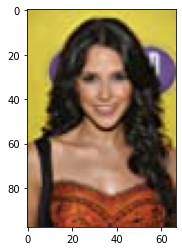

Attributes: ['dhupia', 'neha', 'tv', 'punjabi', 'miss', 'appeared', 'ramp well music', 'ramp well', 'rajdhani tv serial', 'rajdhani tv', 'rajdhani', 'qayamat city threat', 'qayamat city', 'pyar kiya darna'] 
Born: August 27, 
     
1980    
  
in Cochin, Kerala, India

Nickname: nan

Height:  5' 6" (1.68 m)

Birth Name: Neha Pradip Dhupia

Rank: -1.0

-----------------------------------------------

Name: Kareena Kapoor


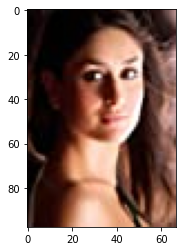

Attributes: ['grandfather', 'kapoor', 'refugee', 'paternal', 'aunt', 'shivdasani', 'shashi', 'bombay', 'rishi', 'appear', 'school', 'speaking', 'son', 'actor'] 
Born: September 21, 
     
1980    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 4" (1.63 m)

Birth Name: Kareena Randhir Kapoor

Rank: -1.0

-----------------------------------------------

Name: Aditya Roy Kapoor


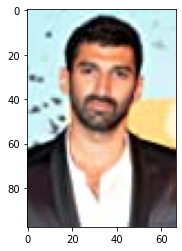

Attributes: ['november bombay maharashtra', 'november bombay', 'kapoor born', 'dear zindagi', 'aditya roy', 'india actor known', 'dear', 'born november', 'maharashtra india actor', 'yeh', 'roy', 'aditya', 'india actor', 'bombay maharashtra india'] 
Born: November 16, 
     
1985    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  6' (1.83 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Kajol


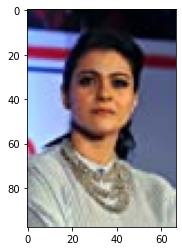

Attributes: ['kajol', 'kuch', 'name khan fanaa', 'married ajay devgn', 'married ajay', 'maharashtra india kajol', 'since february', 'name khan', 'mukherjee actress known', 'mukherjee actress', 'kuch kuch hota', 'kuch kuch', 'kuch hota hai', 'kuch hota'] 
Born: August 5, 
     
1974    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 1" (1.55 m)

Birth Name: Kajol Mukherjee

Rank: -1.0

-----------------------------------------------

Name: Yami Gautam


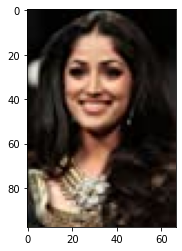

Attributes: ['movie', 'acted', 'performed well box', 'performed well', 'office acted telugu', 'office acted', 'year award', 'vicky donor', 'varun dhawan', 'varun', 'female debut award', 'donor', 'debut year', 'award'] 
Born: November 28, 
     
1988    
  
in Chandigarh, Punjab, India

Nickname: nan

Height:  5' 3½" (1.61 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Kalki Koechlin


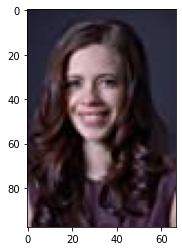

Attributes: ['kalki', 'parent', 'french', 'play', 'role', 'theatre', 'theater', 'dev', 'called', 'university', 'prepare role dev', 'prepare role', 'prepare', 'prashant prakash co'] 
Born: January 10, 
     
1983    
  
in Pondicherry, India

Nickname: nan

Height:  5' 4" (1.63 m)

Birth Name: nan

Rank: 93.0

-----------------------------------------------

Name: Sridevi


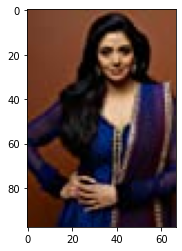

Attributes: ['tamil', 'sridevi', 'film', 'telugu', 'hindi', 'tv', 'uae', 'dubai uae', 'dubai', 'passed away', 'jeetendra', 'appeared', 'tamil film', 'passed'] 
Born: August 13, 
     
1963    
  
in Sivakasi, Madras State, India

Nickname: Puppy
Indian cinema's first female superstar
Chandni
Miss Hawa Hawaii

Height:  5' 6" (1.68 m)

Birth Name: Shree Amma Yanger Ayyapan

Rank: -1.0

-----------------------------------------------

Name: Shilpa Shetty Kundra


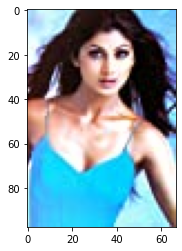

Attributes: ['shilpa', 'actress', 'shetty', 'rishtey', 'housewife', 'print', 'delivered', 'dancer', 'sister shamita', 'shamita', 'phir milenge', 'pardesi babu', 'pardesi', 'milenge'] 
Born: June 8, 
     
1975    
  
in Mangalore, Karnataka, India

Nickname: nan

Height:  5' 6" (1.68 m)

Birth Name: nan

Rank: 75.0

-----------------------------------------------

Name: Dharmendra


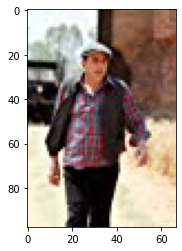

Attributes: ['dharmendra', 'film', 'deol', 'hero', 'hema', 'action', 'aur', 'ke', 'romantic', 'dharam', 'action hero', 'hema malini', 'sunny', 'malini'] 
Born: December 8, 
     
1935    
  
in Nasrali, Punjab, British India

Nickname: nan

Height:  5' 10" (1.78 m)

Birth Name: Dharam Singh Deol

Rank: -1.0

-----------------------------------------------

Name: Tusshar Kapoor


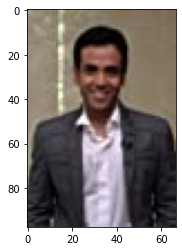

Attributes: ['golmaal', 'kapoor', 'kucch', 'alongside', 'hai', 'office flop although', 'noted acting alongside', 'next year followed', 'next year', 'mujhe kucch kehna', 'mujhe kucch', 'michigan graduated bba', 'michigan graduated', 'michigan'] 
Born: November 20, 
     
1976    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 6¼" (1.69 m)

Birth Name: Tusshar Ravi Kapoor

Rank: -1.0

-----------------------------------------------

Name: Govinda


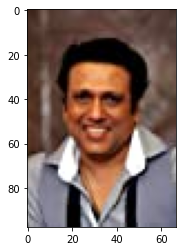

Attributes: ['successful', 'comedy', 'govinda', 'movie', 'based', 'bollywood', 'successful comeback', 'miyan', 'kumer', 'collaboration', 'top', 'directed', 'partner', 'david dhawan'] 
Born: December 21, 
     
1963    
  
in Bombay, Maharashtra, India

Nickname: Chi Chi
Virar Ka Chokra

Height:  5' 4¾" (1.64 m)

Birth Name: Govind Arun Ahuja

Rank: -1.0

-----------------------------------------------

Name: Amrita Rao


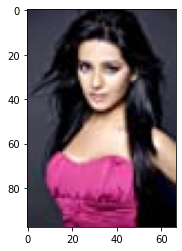

Attributes: ['amrita', 'rao', 'ishq', 'vishq', 'ishq vishq', 'amrita rao', 'vivah', 'perk', 'madhuri dixit', 'madhuri', 'dixit', 'movie', 'assignment', 'hit'] 
Born: June 7, 
     
1981    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 2" (1.57 m)

Birth Name: Amrita Deepak Rao

Rank: -1.0

-----------------------------------------------

Name: Arshad Warsi


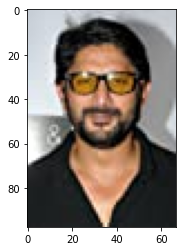

Attributes: ['dance', 'mumbai', 'group mumbai', 'choreographing', 'warsi', 'door', 'age', 'group', 'dancing', 'started', 'prize modern jazz', 'prize modern', 'photo lab meanwhile', 'photo lab'] 
Born: April 19, 
     
1968    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 4" (1.62 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Aishwarya Rai Bachchan


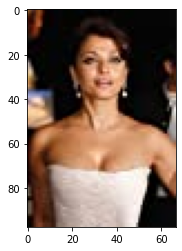

Attributes: ['darling', 'beauty', 'prestigious', 'miss', 'movie', 'indian', 'pyaar ho gaya', 'pyaar ho', 'proven brilliant genuine', 'proven brilliant', 'proven', 'project lined release', 'project lined', 'prestigious hollywood project'] 
Born: November 1, 
     
1973    
  
in Mangalore, Karnataka, India

Nickname: Ash
Gullu

Height:  5' 5" (1.65 m)

Birth Name: Aishwarya Krishnaraj Rai

Rank: -1.0

-----------------------------------------------

Name: Anil Kapoor


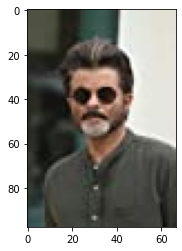

Attributes: ['kapoor', 'anil', 'kapoor elder', 'badhaai', 'school', 'join', 'role', 'elder', 'met', 'anil kapoor', 'fan', 'speaking', 'first', 'movie'] 
Born: December 24, 
     
1956    
  
in Chembur, State of Bombay, India

Nickname: nan

Height:  5' 7" (1.7 m)

Birth Name: nan

Rank: 71.0

-----------------------------------------------

Name: Dilip Kumar


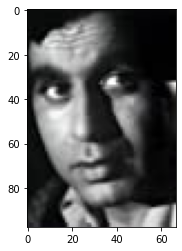

Attributes: ['dilip', 'kumar', 'dilip kumar', 'film', 'flop', 'role', 'apna', 'hit', 'like', 'office flop', 'box office flop', 'hero', 'nasir', 'kranti'] 
Born: December 11, 
     
1922    
  
in Peshawar, North-West Frontier Province, British India

Nickname: Legendary Khan
Tragedy King

Height:  5' 8¼" (1.74 m)

Birth Name: Yusuf Khan

Rank: -1.0

-----------------------------------------------

Name: Aditi Rao Hydari


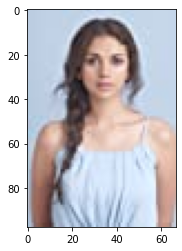

Attributes: ['mishra', 'murder', 'directed', 'paris york', 'london paris york', 'london paris', 'hydari', 'aditi', 'yeh saali zindagi', 'yeh saali', 'sudhir mishra', 'sudhir', 'saali zindagi', 'saali'] 
Born: October 28, 
     
1986    
  
in Hyderabad, Andhra Pradesh, India

Nickname: nan

Height:  5' 1¾" (1.57 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Lara Dutta


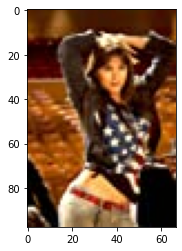

Attributes: ['miss', 'miss universe', 'lara', 'universe', 'dutta', 'history', 'history miss universe', 'history miss', 'crowned miss universe', 'mark', 'writing', 'school', 'crowned miss', 'crowned'] 
Born: April 16, 
     
1978    
  
in Ghaziabad, Uttar Pradesh, India

Nickname: nan

Height:  5' 8" (1.73 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Kangana Ranaut


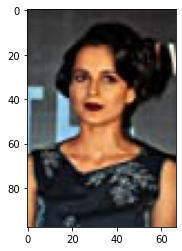

Attributes: ['kangana', 'qv', 'kangana ranaut', 'ranaut', 'queen', 'theater', 'school', 'ranaut returned celebrity', 'ranaut returned', 'ranaut national award', 'ranaut national', 'qv tanu wed', 'qv tanu', 'qv queen qv'] 
Born: March 20, 
     
1987    
  
in Bhambla, Himachal Pradesh, India

Nickname: nan

Height:  5' 5¼" (1.66 m)

Birth Name: Kangana Amardeep Ranaut

Rank: 70.0

-----------------------------------------------

Name: Shah Rukh Khan


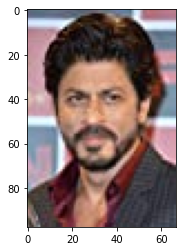

Attributes: ['khan', 'kuch', 'om', 'film', 'son', 'om chak de', 'om chak', 'office villainous role', 'office villainous', 'office success film', 'october three child', 'october three', 'november delhi india', 'november delhi'] 
Born: November 2, 
     
1965    
  
in New Delhi, India

Nickname: King Khan
SRK
The Badshah of Bollywood
The King of Bollywood

Height:  5' 6¼" (1.69 m)

Birth Name: nan

Rank: 6.0

-----------------------------------------------

Name: Mugdha Godse


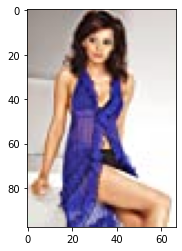

Attributes: ['pune maharashtra india', 'pune maharashtra', 'producer known fashion', 'producer known', 'oruvan best fun', 'oruvan best', 'oruvan', 'mugdha godse born', 'mugdha godse', 'mugdha', 'maharashtra india actress', 'fun begin', 'best fun begin', 'best fun'] 
Born: July 26, 
     
1982    
  
in Pune, Maharashtra, India

Nickname: nan

Height:  5' 5¾" (1.67 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Ranveer Singh


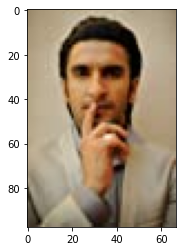

Attributes: ['singh', 'ranveer singh', 'ranveer', 'bittoo', 'band baaja baaraat', 'band baaja', 'baaja baaraat', 'baaja', 'band', 'baaraat', 'sharma', 'called', 'film', 'award'] 
Born: July 6, 
     
1985    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 8" (1.73 m)

Birth Name: Ranveer Bhavnani

Rank: 7.0

-----------------------------------------------

Name: Isha Koppikar


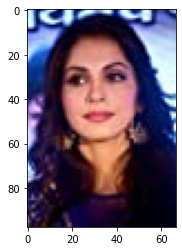

Attributes: ['isha', 'got', 'part', 'lasted', 'khallas', 'kavidai', 'name', 'modeled', 'role', 'bollywood', 'lot', 'course', 'still', 'college'] 
Born: September 19, 
     
1976    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 7" (1.7 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Priyanka Chopra


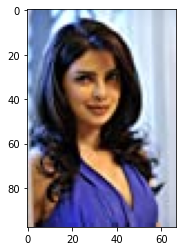

Attributes: ['chopra', 'dr', 'short', 'college', 'psychologist enjoys indian', 'psychologist enjoys', 'program', 'prepared study completed', 'prepared study', 'prepared', 'poetry short story', 'poetry short', 'poetry', 'physician varied upbringing'] 
Born: July 18, 
     
1982    
  
in Jamshedpur, Bihar, India

Nickname: nan

Height:  5' 5" (1.65 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Sameera Reddy


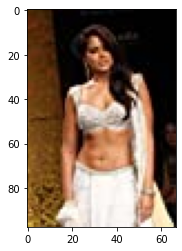

Attributes: ['sameera', 'film', 'video', 'video game', 'bbc', 'spice', 'housewife', 'actress', 'street', 'game', 'india', 'festival', 'life', 'play'] 
Born: September 8, 
     
1982

Nickname: nan

Height:  5' 5¼" (1.65 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Paresh Rawal


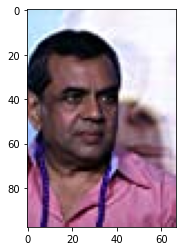

Attributes: ['bombay', 'producer actor known', 'producer actor', 'pheri omg oh', 'pheri omg', 'paresh rawal born', 'paresh rawal', 'paresh', 'oh god hungama', 'may bombay state', 'may bombay', 'married swaroop sampat', 'married swaroop', 'pheri'] 
Born: May 30, 
     
1950    
  
in Bombay, State of Bombay, India

Nickname: nan

Height:  5' 8" (1.73 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Urmila Matondkar


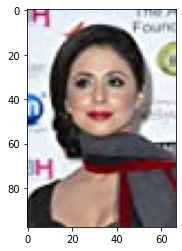

Attributes: ['urmila', 'actress', 'film', 'talent', 'sensuality', 'seductress', 'fellow actress', 'bhosle', 'asha bhosle', 'girl', 'sizzling', 'fellow', 'varma', 'ram gopal varma'] 
Born: February 4, 
     
1974    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 1½" (1.56 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Sonakshi Sinha


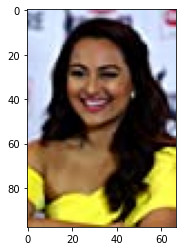

Attributes: ['sinha', 'ramp lakme fashion', 'ramp lakme', 'poonam sinha sister', 'poonam sinha', 'poonam', 'model walked ramp', 'model walked', 'medium following various', 'medium following', 'luv sinha kussh', 'luv sinha', 'legendary indian actor', 'legendary indian'] 
Born: June 2, 
     
1987    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 6" (1.67 m)

Birth Name: nan

Rank: 59.0

-----------------------------------------------

Name: Zayed Khan


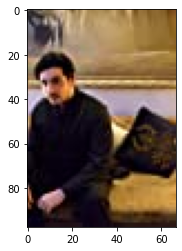

Attributes: ['khan', 'mallaika parekh', 'mallaika', 'kodaikanal', 'khan khan', 'zayed khan', 'zayed', 'parekh', 'actor', 'film', 'om', 'roshan', 'bollywood actor', 'ajay'] 
Born: July 5, 
     
1980    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 10¾" (1.8 m)

Birth Name: Zayed Abbas Khan

Rank: -1.0

-----------------------------------------------

Name: Ranbir Kapoor


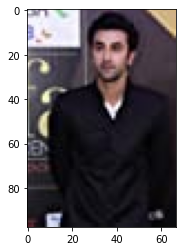

Attributes: ['kapoor', 'highly', 'randhir kapoor rajiv', 'rajiv kapoor kunal', 'rajiv kapoor', 'prestigious considered first', 'prestigious considered', 'presence kapoor dropped', 'presence kapoor', 'non existent social', 'non existent', 'nephew actor randhir', 'nephew actor', 'neetu singh nephew'] 
Born: September 28, 
     
1982    
  
in Mumbai, India

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 45.0

-----------------------------------------------

Name: Riteish Deshmukh


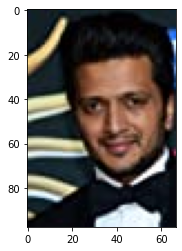

Attributes: ['riteish', 'minister', 'deshmukh', 'masti', 'marathi', 'dhamaal', 'science', 'former', 'film', 'successful', 'producer', 'later', 'producer marathi success', 'producer marathi'] 
Born: December 17, 
     
1978    
  
in Latur, Maharashtra, India

Nickname: nan

Height:  5' 8" (1.73 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Sharman Joshi


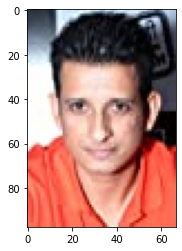

Attributes: ['prerna chopra since', 'prerna chopra', 'married prerna chopra', 'married prerna', 'unlimited', 'rang de basanti', 'rang de', 'rang', 'prerna', 'known idiot', 'hotchpotch', 'fun unlimited', 'de basanti', 'born april'] 
Born: April 28, 
     
1979    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 9" (1.75 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Irrfan Khan


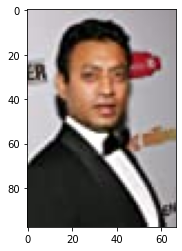

Attributes: ['khan', 'writer', 'dialogue writer', 'dialogue', 'tonk', 'qarib', 'irfan', 'comment', 'family', 'tournament', 'religious', 'muslim', 'century', 'award'] 
Born: January 7, 
     
1967    
  
in Jaipur, Rajasthan, India

Nickname: nan

Height:  5' 10½" (1.79 m)

Birth Name: Sahabzade Irrfan Ali Khan

Rank: -1.0

-----------------------------------------------

Name: Omi Vaidya


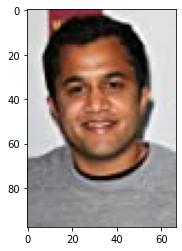

Attributes: ['patel since august', 'patel since', 'omi vaidya actor', 'omi vaidya', 'omi', 'minal patel since', 'minal patel', 'minal', 'married minal patel', 'married minal', 'resident', 'known idiot', 'alien', 'rose'] 
Born: nan

Nickname: nan

Height:  5' 4½" (1.64 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Salman Khan


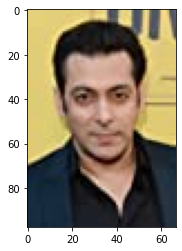

Attributes: ['salman', 'killing', 'aid', 'salman khan', 'hit', 'khan', 'patient', 'aid patient', 'box office', 'box', 'office', 'organization', 'kuch', 'role'] 
Born: December 27, 
     
1965    
  
in Indore, Madhya Pradesh, India

Nickname: Sallu
Bhaijan
Dabangg Khan
Rambo of India
The Sylvester Stallone of India
Controversial Khan
Tiger Khan
The Tiger of Bollywood
Muscle Khan
Supreme Khan
Blockbuster Star
Robin Hood Khan

Height:  5' 6½" (1.69 m)

Birth Name: Abdul Rashid Salim Salman Khan

Rank: 3.0

-----------------------------------------------

Name: Shahid Kapoor


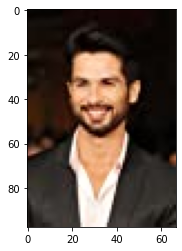

Attributes: ['shahid', 'young', 'sincerity', 'shahid kapoor', 'nothing', 'kaminey', 'jab met', 'jab', 'character', 'hold', 'range', 'met', 'talent', 'kapoor'] 
Born: February 25, 
     
1981    
  
in New Delhi, India

Nickname: Dodo
Sasha

Height:  5' 6" (1.67 m)

Birth Name: nan

Rank: 36.0

-----------------------------------------------

Name: Juhi Chawla


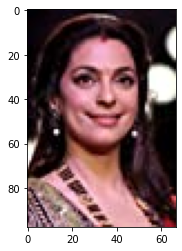

Attributes: ['juhi', 'chawla', 'miss india', 'duplicate', 'chawla family', 'miss', 'ludhiana', 'qayamat', 'india', 'speaking', 'appearance', 'daughter', 'release', 'rahi pyar ke'] 
Born: November 13, 
     
1967    
  
in Ludhiana, Punjab, India

Nickname: nan

Height:  5' 2" (1.58 m)

Birth Name: Juhi S. Chawla

Rank: -1.0

-----------------------------------------------

Name: Preity Zinta


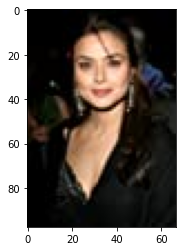

Attributes: ['preity', 'shah', 'shah rukh khan', 'shah rukh', 'rukh khan', 'rukh', 'bachchan', 'khan', 'roshan', 'never', 'heart', 'would', 'liril commercial', 'liked'] 
Born: January 31, 
     
1975    
  
in Simla, India

Nickname: nan

Height:  5' 2" (1.58 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Bobby Deol


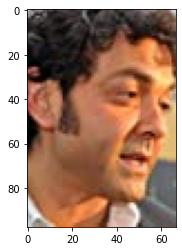

Attributes: ['deol', 'son', 'step', 'dharam', 'bollywood mega star', 'bollywood mega', 'second son', 'mega star', 'mega', 'bollywood', 'dharmendra', 'bobby deol', 'bobby', 'named'] 
Born: January 27, 
     
1969    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 9½" (1.76 m)

Birth Name: Vijay Singh Dharmendra Deol

Rank: -1.0

-----------------------------------------------

Name: Sonam Kapoor


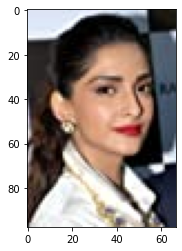

Attributes: ['sonam', 'jewellery', 'kapoor', 'review', 'established', 'superstar', 'film', 'brand', 'back', 'director', 'propelled league superstar', 'propelled league', 'propelled', 'promotion council'] 
Born: June 9, 
     
1985    
  
in Chembur, Maharashtra, India

Nickname: nan

Height:  5' 7½" (1.71 m)

Birth Name: Sonam Anil Kapoor

Rank: -1.0

-----------------------------------------------

Name: Akshaye Khanna


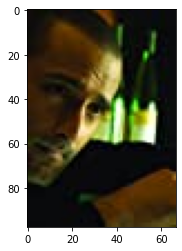

Attributes: ['khanna', 'film', 'gandhi', 'khanna appeared', 'best', 'performance', 'award best', 'filmfare', 'award', 'release', 'filmfare award best', 'success khanna', 'string unsuccessful', 'performance negative role'] 
Born: March 28, 
     
1975    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 8½" (1.74 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Shazahn Padamsee


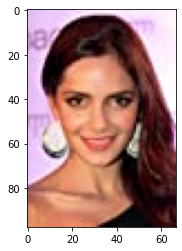

Attributes: ['padamsee', 'stage', 'film', 'indian film', 'prominent role acted', 'prominent role', 'prabhakar made stage', 'prabhakar made', 'prabhakar', 'play called unspoken', 'performance featured madhur', 'performance featured', 'patel housefull due', 'patel housefull'] 
Born: October 19, 
     
1987

Nickname: nan

Height:  5' 4" (1.62 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Mithun Chakraborty


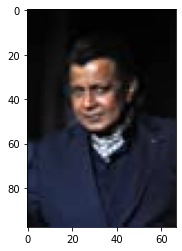

Attributes: ['presidency british india', 'presidency british', 'presidency', 'oh god vivekananda', 'mithun chakraborty born', 'mithun chakraborty', 'mithun', 'married yogeeta bali', 'married yogeeta', 'married sridevi helena', 'married sridevi', 'luke', 'married', 'omg oh god'] 
Born: June 16, 
     
1947    
  
in Barisal, Bengal Presidency, British India

Nickname: nan

Height:  5' 9" (1.75 m)

Birth Name: Gouranga Chakraborti

Rank: -1.0

-----------------------------------------------

Name: Sanjay Dutt


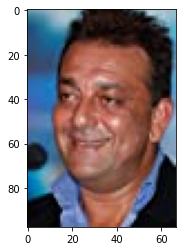

Attributes: ['vaastav', 'sanjay', 'vaastav vaastav reality', 'vaastav vaastav', 'vaastav reality', 'munna bhai', 'munna', 'earned many', 'bhai', 'many', 'dutt', 'reality', 'earned', 'life'] 
Born: July 29, 
     
1959    
  
in Bombay, State of Bombay, India

Nickname: Sanju Baba
Baba
The Nayak of Hindi Cinema
The Arnold Schwarzenegger of India

Height:  5' 10" (1.78 m)

Birth Name: Sanjay Balraj Dutt

Rank: -1.0

-----------------------------------------------

Name: Rani Mukherjee
No image
Attributes: ['liye', 'rani mukherjee', 'mukherjee actress known', 'mukherjee actress', 'tumhare', 'actress known', 'mukherjee', 'rani', 'actress', 'known'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Celina Jaitly


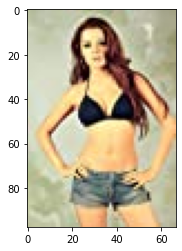

Attributes: ['celina', 'army', 'year celina', 'indian army', 'spent', 'india', 'jaitly', 'afghan', 'colonel', 'however', 'city', 'year', 'indian', 'beauty'] 
Born: November 24, 
     
1981    
  
in Shimla, Himachal Pradesh, India

Nickname: nan

Height:  5' 6" (1.68 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Deepika Padukone


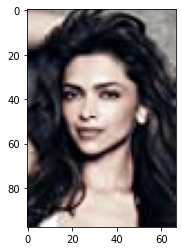

Attributes: ['padukone', 'deepika', 'model', 'model year', 'kingfisher', 'indian model', 'deepika padukone', 'annual', 'year', 'face', 'international', 'modeling', 'number', 'print television advertising'] 
Born: January 5, 
     
1986    
  
in Copenhagen, Denmark

Nickname: nan

Height:  5' 7½" (1.71 m)

Birth Name: nan

Rank: 10.0

-----------------------------------------------

Name: Vidya Balan


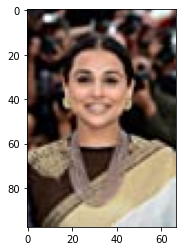

Attributes: ['vidya', 'tamil', 'early', 'tamil producer', 'sociology', 'priya', 'parineeta', 'degree sociology', 'balan', 'rejected', 'ardent', 'aid', 'producer', 'malyalam'] 
Born: January 1, 
     
1979    
  
in Bombay, Maharashtra, India

Nickname: nan

Height:  5' 2" (1.57 m)

Birth Name: Vidya P. Balan

Rank: -1.0

-----------------------------------------------

Name: Twinkle Khanna


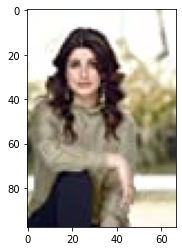

Attributes: ['twinkle', 'tina', 'birth', 'kapadia', 'araav', 'alias', 'subsequently', 'store', 'opposite', 'engaged', 'bollywood actress', 'married', 'khan', 'dad'] 
Born: December 29, 
     
1974    
  
in Pune, Maharashtra, India

Nickname: nan

Height:  5' 3" (1.6 m)

Birth Name: Tina Jatin Khanna

Rank: -1.0

-----------------------------------------------

Name: Prachi Desai


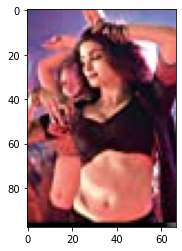

Attributes: ['prachi', 'kasamh se', 'kasamh', 'se', 'aired', 'jhalak', 'pune', 'dancing', 'study', 'zee tv', 'wild card entry', 'wild card', 'surat', 'pune higher study'] 
Born: September 12, 
     
1988    
  
in Surat, Gujarat, India

Nickname: nan

Height:  5' 2" (1.57 m)

Birth Name: nan

Rank: -1.0

-----------------------------------------------

Name: Abhishek Bachchan


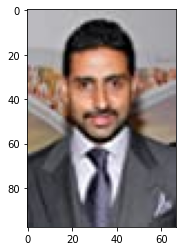

Attributes: ['srivastav', 'rai', 'school', 'school bombay', 'harivansh rai', 'harivansh', 'abhishek', 'starting', 'engaged', 'aishwarya', 'star', 'government', 'april', 'bachchan'] 
Born: February 5, 
     
1976    
  
in Bombay, Maharashtra, India

Nickname: Baby B
Junior B
A B
Junior
Abi
Abhi
AB Baby

Height:  6' 1" (1.85 m)

Birth Name: Abhishek Amitabh Srivastav

Rank: -1.0

-----------------------------------------------

Name: Saif Ali Khan


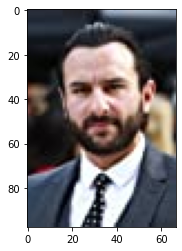

Attributes: ['ali khan', 'ali', 'khan', 'saif', 'bollywood actress', 'actress', 'tagore', 'sharmila tagore', 'sharmila', 'cricketer', 'bollywood', 'saif ali khan', 'saif ali', 'crore'] 
Born: August 16, 
     
1970    
  
in New Delhi, India

Nickname: Saifu
Chote Nawab
Nawab of Pataudi

Height:  5' 6" (1.68 m)

Birth Name: Sajid Ali Khan

Rank: 74.0

-----------------------------------------------

Name: Virat Kohli


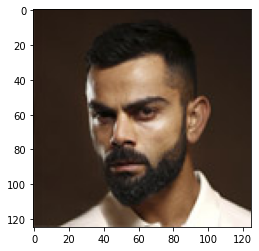

Attributes: ['prolific run scoring', 'prolific run', 'occupies top spot', 'occupies top', 'list prolific run', 'list prolific', 'spree', 'prolific', 'occupies', 'spot forbes india', 'spot forbes', 'scoring', 'cricket', 'run'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 1.0

-----------------------------------------------

Name: MS Dhoni


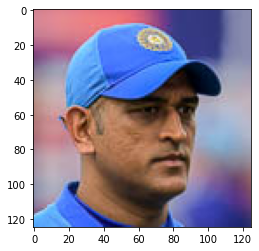

Attributes: ['steady', 'brand endorsement', 'endorsement', 'brand'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 5.0

-----------------------------------------------

Name: Alia Bhatt


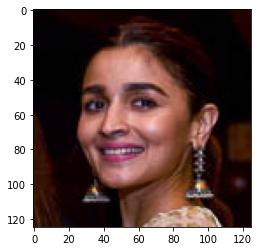

Attributes: ['moved list thanks', 'moved list', 'medium popularity', 'massive social medium', 'massive social', 'list thanks massive', 'list thanks', 'alia bhatt', 'alia', 'massive', 'popularity', 'thanks', 'bhatt', 'social medium'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 8.0

-----------------------------------------------

Name: Sachin Tendulkar


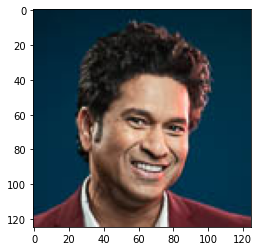

Attributes: ['investment', 'captain', 'brand endorsement', 'thanks', 'former', 'spot', 'return', 'endorsement', 'brand', 'india'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 9.0

-----------------------------------------------

Name: Rohit Sharma


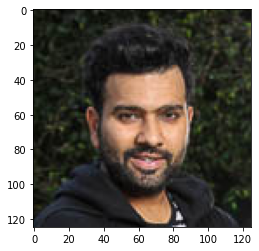

Attributes: ['jump', 'rohit', 'field', 'sharma', 'following'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 11.0

-----------------------------------------------

Name: Priyanka Chopra Jonas


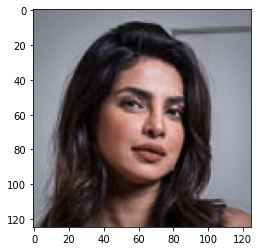

Attributes: ['social medium presence', 'ranking', 'priyanka chopra jonas', 'medium presence', 'last year year', 'jonas', 'chopra jonas', 'back strong', 'year year', 'priyanka chopra', 'priyanka', 'jumped', 'presence', 'strong'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 14.0

-----------------------------------------------

Name: AR Rahman


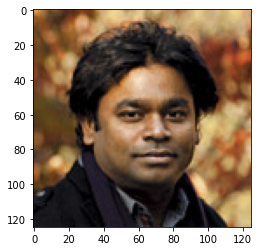

Attributes: ['rahman regular top', 'rahman regular', 'slid', 'regular', 'rahman', 'composer', 'celebrity list last', 'rank celebrity list', 'rank celebrity', 'list last year', 'list last', 'five', 'last year', 'singer'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 16.0

-----------------------------------------------

Name: Pritam


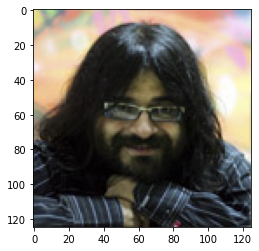

Attributes: ['pritam returned list', 'pritam returned', 'pritam', 'music movie kalank', 'music movie', 'movie kalank chhichhore', 'list year high', 'rank riding success', 'rank riding', 'high rank', 'riding success', 'kalank', 'chhichhore', 'list year'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 17.0

-----------------------------------------------

Name: Amit Trivedi


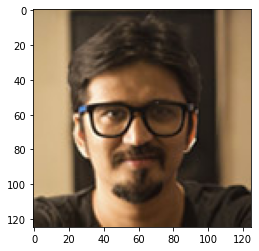

Attributes: ['music ayushmann khurrana', 'music ayushmann', 'list thanks music', 'list thanks', 'khurrana', 'ayushmann khurrana', 'ayushmann', 'andhadhun', 'amit', 'starrer', 'thanks', 'music', 'india celebrity list', 'india celebrity'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 19.0

-----------------------------------------------

Name: Vishal-Shekhar


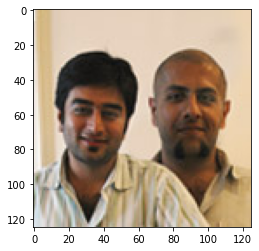

Attributes: ['music composer duo', 'music composer', 'student year', 'soundtrack', 'duo', 'composer', 'bharat', 'thanks', 'student', 'music', 'hit', 'year'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 20.0

-----------------------------------------------

Name: Ajay-Atul


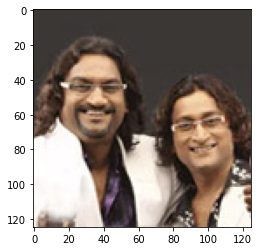

Attributes: ['music big ticket', 'music big', 'live composing music', 'live composing', 'zoom', 'ticket', 'composing', 'backed earnings', 'backed', 'atul', 'live', 'ajay', 'earnings', 'big'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 22.0

-----------------------------------------------

Name: Shankar-Ehsaan-Loy


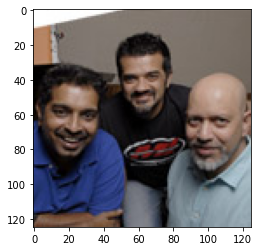

Attributes: ['music together year', 'music together', 'make big buck', 'make big', 'buck', 'trio', 'together', 'live', 'big', 'music', 'make', 'year'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 24.0

-----------------------------------------------

Name: Varun Dhawan


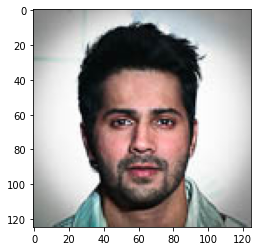

Attributes: ['office dhawan earnings', 'office dhawan', 'pipeline', 'endorsement pipeline', 'kalank', 'dhawan', 'strong', 'earnings', 'endorsement', 'box office', 'box', 'office'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 25.0

-----------------------------------------------

Name: Arijit Singh


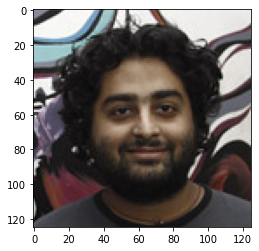

Attributes: ['singh', 'pulling concert across', 'pulling concert', 'pulling', 'playback arijit singh', 'playback arijit', 'kabir', 'crowd', 'andhadhun', 'playback', 'concert', 'score', 'king', 'across'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 26.0

-----------------------------------------------

Name: Mohanlal


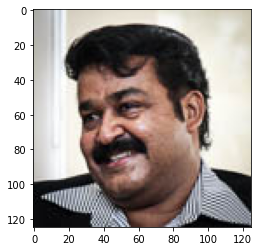

Attributes: ['paid actor malayalam', 'mohanlal highest paid', 'mohanlal highest', 'malayalam cinema zoom', 'zoom', 'list dropping last', 'list dropping', 'celebrity list dropping', 'paid actor', 'mohanlal', 'malayalam cinema', 'highest paid actor', 'dropping last year', 'dropping last'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 27.0

-----------------------------------------------

Name: Shraddha Kapoor


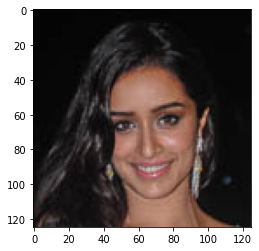

Attributes: ['back', 'score high fame', 'score high', 'saaho', 'riding success', 'chhichhore', 'back hit', 'back back hit', 'back back', 'score', 'high fame', 'riding', 'high', 'fame'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 28.0

-----------------------------------------------

Name: Neha Kakkar


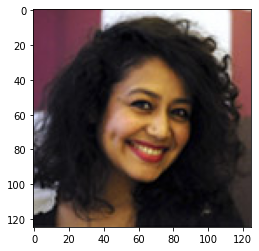

Attributes: ['high', 'popular live indian', 'popular live', 'neha kakkar high', 'neha kakkar', 'live indian idol', 'live indian', 'jury', 'high social medium', 'high social', 'high rank', 'neha', 'social medium fame', 'medium fame'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 29.0

-----------------------------------------------

Name: Rishabh Pant


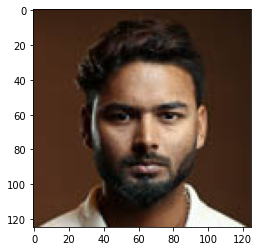

Attributes: ['point social medium', 'point social', 'pant make debut', 'pant make', 'pant', 'list rank back', 'make debut list', 'debut list rank', 'debut list', 'cricketer', 'make debut', 'busy', 'season', 'point'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 30.0

-----------------------------------------------

Name: Hardik Pandya


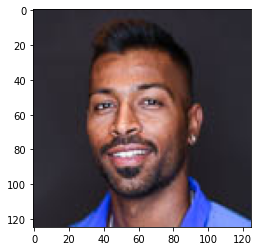

Attributes: ['raking controversy koffee', 'raking controversy', 'raking', 'pandya rank slip', 'pandya rank', 'pandya', 'controversy', 'karan', 'rank'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 31.0

-----------------------------------------------

Name: Jasprit Bumrah


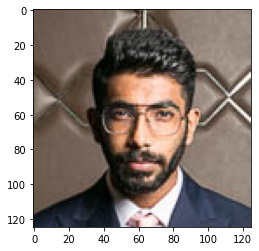

Attributes: ['lethal fast bowler', 'lethal fast', 'lethal', 'india highest', 'finished', 'today', 'world', 'highest', 'india'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 33.0

-----------------------------------------------

Name: KL Rahul


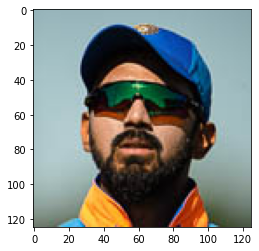

Attributes: ['rahul overshadows controversy', 'rahul overshadows', 'performance climbing spot', 'performance climbing', 'overshadows controversy field', 'overshadows controversy', 'overshadows', 'steady performance', 'rahul', 'climbing', 'steady', 'controversy', 'list year', 'field'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 34.0

-----------------------------------------------

Name: Shikhar Dhawan


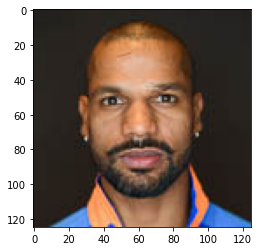

Attributes: ['performance odis iplt', 'odis iplt dhawan', 'odis iplt', 'number forbes india', 'number forbes', 'performance odis', 'odis', 'consistent performance', 'rose', 'consistent', 'dhawan', 'number', 'india celebrity list', 'rank'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 35.0

-----------------------------------------------

Name: Kriti Sanon


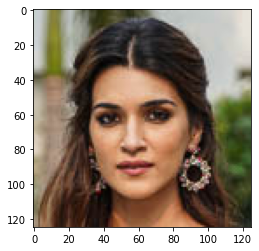

Attributes: ['scoring high fame', 'sanon', 'list scoring high', 'list scoring', 'kriti sanon', 'kriti', 'celebrity list scoring', 'scoring high', 'scoring', 'high fame', 'debut forbes india', 'debut forbes', 'high', 'fame'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 38.0

-----------------------------------------------

Name: Diljit Dosanjh


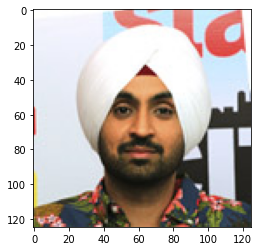

Attributes: ['music television', 'multi hatted dosanjh', 'multi hatted', 'climbing', 'cashing', 'multi', 'television', 'music', 'rank', 'celebrity', 'film'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 39.0

-----------------------------------------------

Name: Tiger Shroff


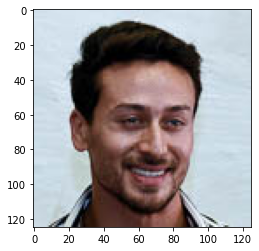

Attributes: ['muted response student', 'muted response', 'muted', 'student year', 'response', 'fame endorsement', 'shroff', 'despite', 'student', 'good', 'endorsement', 'year', 'fame'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 40.0

-----------------------------------------------

Name: Sonam Kapoor Ahuja


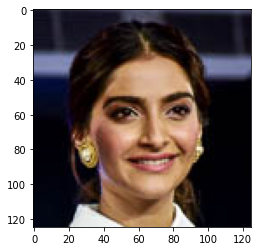

Attributes: ['medium fame sonam', 'high social medium', 'high social', 'ahuja', 'scoring high', 'jumped', 'sonam kapoor', 'social medium fame', 'scoring', 'medium fame', 'sonam', 'social medium', 'spot', 'social'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 42.0

-----------------------------------------------

Name: Disha Patani


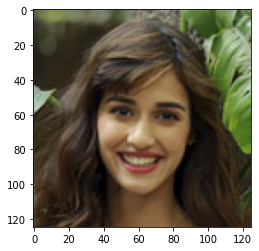

Attributes: ['position forbes india', 'position forbes', 'patani social medium', 'patani social', 'patani', 'medium fame brought', 'list earnings crore', 'list earnings', 'position', 'social medium fame', 'medium fame', 'earnings crore', 'social medium', 'earnings'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 43.0

-----------------------------------------------

Name: Prabhas


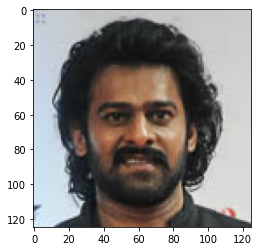

Attributes: ['raked second highest', 'raked second', 'prabhas saaho raked', 'prabhas saaho', 'prabhas', 'phenomenal success baahubali', 'phenomenal success', 'phenomenal', 'opening day collection', 'opening day', 'highest opening', 'saaho', 'raked', 'collection'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 44.0

-----------------------------------------------

Name: Vijay


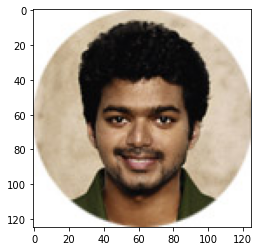

Attributes: ['raked crore', 'rajinikanth diwali release', 'rajinikanth diwali', 'bankable', 'raked', 'rajinikanth', 'vijay', 'already', 'crore', 'tamil', 'cinema', 'release', 'actor'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 47.0

-----------------------------------------------

Name: Guru Randhawa


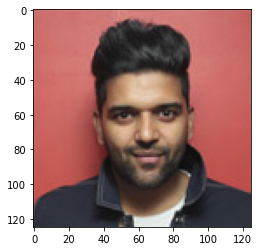

Attributes: ['old high rated', 'old high', 'make debut forbes', 'make debut', 'year old', 'debut forbes india', 'debut forbes', 'old', 'singer', 'high', 'make', 'india celebrity list', 'india celebrity', 'forbes india celebrity'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 49.0

-----------------------------------------------

Name: Karan Johar


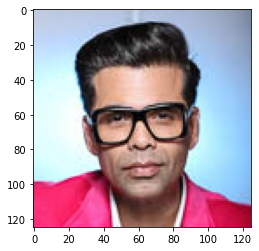

Attributes: ['producer johar rough', 'producer johar', 'popular season', 'office talk returned', 'office talk', 'rough', 'talk', 'johar', 'season', 'returned', 'popular', 'producer', 'box office', 'box'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 50.0

-----------------------------------------------

Name: Ravindra Jadeja


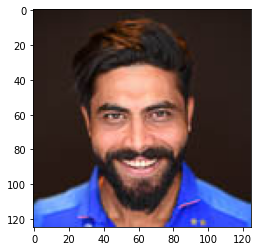

Attributes: ['annual', 'contract', 'climbed', 'year'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 51.0

-----------------------------------------------

Name: Ajith Kumar


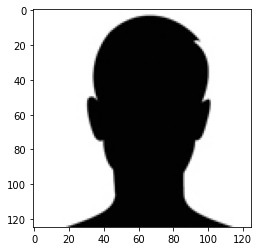

Attributes: ['playing age ajith', 'playing age', 'tamil actor', 'shy away', 'rare', 'list dropping last', 'list dropping', 'celebrity list dropping', 'ajith', 'shy', 'return forbes india', 'return forbes', 'dropping last year', 'dropping last'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 52.0

-----------------------------------------------

Name: Kapil Sharma


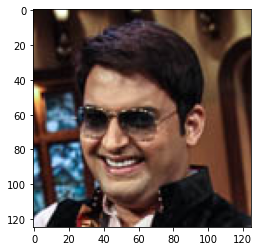

Attributes: ['make comeback forbes', 'list comedian kapil', 'list comedian', 'comedian', 'make comeback', 'dropping last year', 'dropping last', 'dropping', 'celebrity list rank', 'list', 'sharma', 'list rank', 'comeback', 'last year'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 53.0

-----------------------------------------------

Name: Mahesh Babu


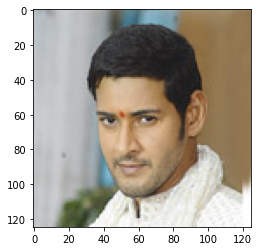

Attributes: ['maharshi year south', 'maharshi year', 'maharshi', 'rank forbes india', 'rank forbes', 'south indian', 'south', 'starring', 'india celebrity list', 'rank', 'india celebrity', 'forbes india celebrity', 'forbes india', 'forbes'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 54.0

-----------------------------------------------

Name: S. Shankar


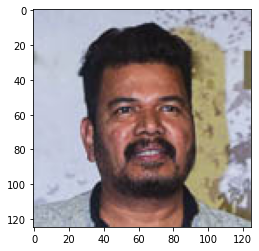

Attributes: ['maker rank list', 'maker rank', 'list director figure', 'list director', 'south indian movie', 'movie maker', 'indian movie', 'figure', 'south indian', 'maker', 'south', 'rank', 'india celebrity', 'forbes india celebrity'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 55.0

-----------------------------------------------

Name: Kamal Haasan


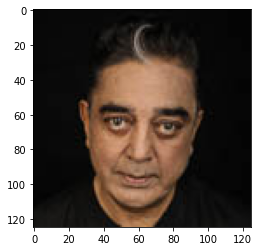

Attributes: ['producer singer choreographer', 'producer singer', 'film actor director', 'actor director producer', 'year film', 'jumped', 'choreographer', 'director producer', 'film actor', 'actor director', 'singer', 'year', 'producer', 'rank'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 56.0

-----------------------------------------------

Name: Madhuri Dixit Nene


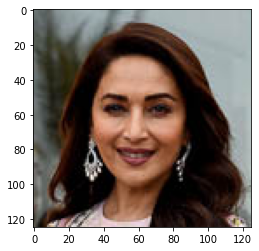

Attributes: ['producer august marathi', 'producer august', 'plus turned producer', 'plus turned', 'netflix film', 'nene saw success', 'nene saw', 'marathi netflix film', 'marathi netflix', 'madhuri dixit nene', 'success total dhamaal', 'success total', 'plus', 'nene'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 57.0

-----------------------------------------------

Name: Badshah


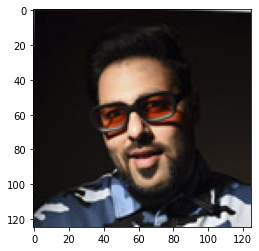

Attributes: ['list improved year', 'list improved', 'working film', 'aladdin', 'saaho', 'rank celebrity list', 'rank celebrity', 'thanks', 'working', 'rank', 'celebrity list', 'celebrity', 'list', 'film'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 58.0

-----------------------------------------------

Name: Rohit Shetty


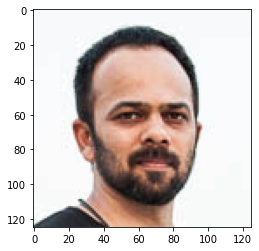

Attributes: ['mark box office', 'mark box', 'film cross crore', 'film cross', 'eighth', 'cross crore', 'cross', 'consecutive', 'rohit', 'shetty', 'mark', 'crore', 'box office', 'box'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 60.0

-----------------------------------------------

Name: Kuldeep Yadav


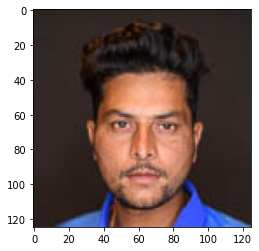

Attributes: ['list caked steady', 'list caked', 'leg spinner debutant', 'leg spinner', 'left arm chinaman', 'left arm', 'steady performance', 'performance odis', 'odis', 'leg', 'arm', 'steady', 'debutant', 'left'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 61.0

-----------------------------------------------

Name: Mammootty


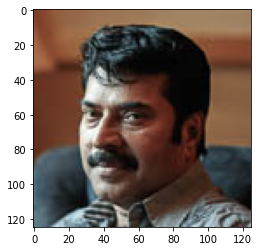

Attributes: ['malayalam cinema superstar', 'list falling', 'malayalam cinema', 'figure', 'rank forbes india', 'rank forbes', 'malayalam', 'superstar', 'cinema', 'india celebrity list', 'rank', 'india celebrity', 'forbes india celebrity', 'forbes india'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 62.0

-----------------------------------------------

Name: PV Sindhu


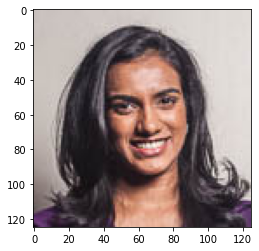

Attributes: ['pv sindhu became', 'pv sindhu', 'pv', 'player win bwf', 'player win', 'championship', 'became first indian', 'badminton', 'minute', 'first indian', 'became first', 'player', 'winning', 'win'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 63.0

-----------------------------------------------

Name: Dhanush


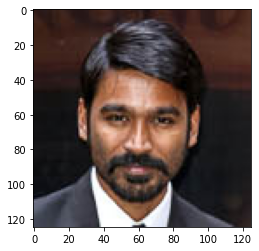

Attributes: ['producer slid nine', 'producer slid', 'nine rank basking', 'nine rank', 'tamil actor', 'slid', 'basking', 'nine', 'actor producer', 'tamil', 'producer', 'rank', 'success', 'hit'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 64.0

-----------------------------------------------

Name: Sara Ali Khan


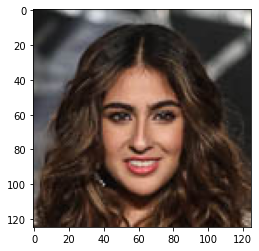

Attributes: ['list led string', 'list led', 'led string brand', 'led string', 'led', 'debutante', 'string', 'amrita singh', 'amrita', 'brand endorsement', 'saif ali khan', 'saif ali', 'saif', 'ali khan'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 66.0

-----------------------------------------------

Name: Kartik Aaryan


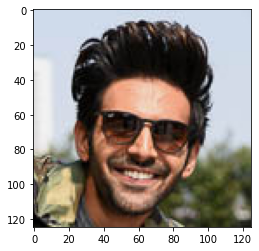

Attributes: ['luka chuppi kriti', 'luka chuppi', 'luka', 'list hit film', 'list hit', 'sanon', 'kriti sanon', 'kriti', 'hit film', 'debut forbes india', 'debut forbes', 'india celebrity list', 'india celebrity', 'forbes india celebrity'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 67.0

-----------------------------------------------

Name: Taapsee Pannu


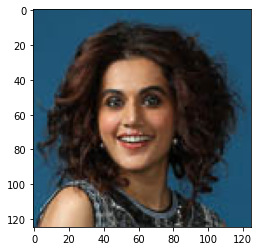

Attributes: ['pannu see fame', 'pannu see', 'pannu', 'see', 'hindi telugu tamil', 'four hit', 'across india', 'hindi telugu', 'telugu tamil', 'hit year', 'across', 'biggest', 'telugu', 'four'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 68.0

-----------------------------------------------

Name: Sushant Singh Rajput


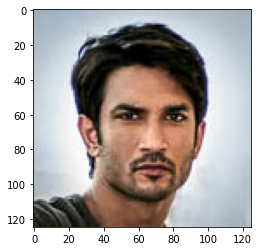

Attributes: ['rajput slipped list', 'rajput slipped', 'made back sonchiriya', 'made back', 'list made back', 'list made', 'rajput', 'chhichhore', 'slipped', 'back', 'singh', 'made', 'list'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 69.0

-----------------------------------------------

Name: Vicky Kaushal


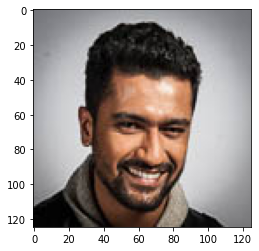

Attributes: ['raked nearly crore', 'raked nearly', 'nearly crore box', 'nearly crore', 'made vicky kaushal', 'made vicky', 'strike', 'kaushal', 'crore box office', 'crore box', 'raked', 'nearly', 'year made', 'vicky'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 72.0

-----------------------------------------------

Name: Sanjeev Kapoor


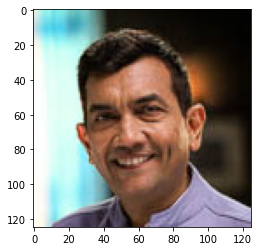

Attributes: ['chef', 'mile', 'kapoor earnings', 'chef category', 'celebrity chef category', 'celebrity chef', 'consistent', 'stay', 'sanjeev', 'category', 'earnings', 'kapoor', 'celebrity'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 73.0

-----------------------------------------------

Name: Malaika Arora


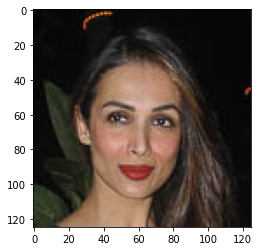

Attributes: ['fitness', 'venture', 'busy', 'apart', 'reality', 'celebrity'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 76.0

-----------------------------------------------

Name: Trivikram Srinivas


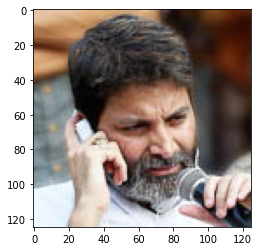

Attributes: ['mark debut forbes', 'mark debut', 'mark', 'celebrity list rank', 'list rank', 'filmmaker', 'debut forbes india', 'debut forbes', 'telugu', 'india celebrity list', 'rank', 'india celebrity', 'forbes india celebrity', 'forbes india'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 77.0

-----------------------------------------------

Name: Ali Abbas Zafar


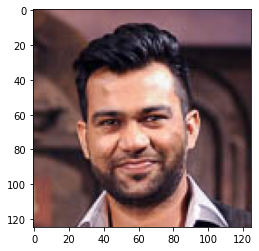

Attributes: ['list rank riding', 'rank riding success', 'rank riding', 'zafar', 'riding success', 'abbas', 'starrer', 'celebrity list rank', 'list rank', 'bharat', 'riding', 'debuted', 'salman khan', 'salman'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 78.0

-----------------------------------------------

Name: Divyanka Tripathi Dahiya


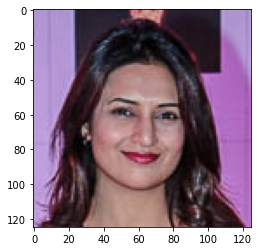

Attributes: ['th', 'moving', 'successful', 'rank'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 79.0

-----------------------------------------------

Name: Siva


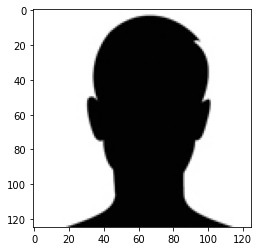

Attributes: ['owing success viswasam', 'owing success', 'list owing success', 'list owing', 'owing', 'make debut forbes', 'make debut', 'debut forbes india', 'debut forbes', 'make', 'india celebrity list', 'india celebrity', 'forbes india celebrity', 'forbes india'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 80.0

-----------------------------------------------

Name: Saina Nehwal


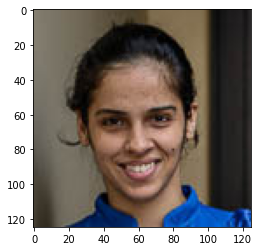

Attributes: ['rough', 'ace', 'spot forbes india', 'spot forbes', 'global', 'slipped', 'st', 'spot', 'title', 'india celebrity list', 'india celebrity', 'forbes india celebrity', 'forbes india', 'forbes'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 81.0

-----------------------------------------------

Name: Bharti Singh


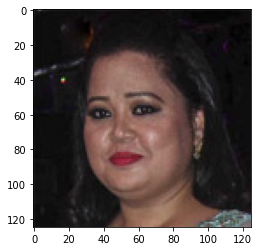

Attributes: ['notch year rank', 'notch year', 'notch', 'comedian', 'bharti', 'dropped', 'rank forbes india', 'rank forbes', 'singh', 'india celebrity list', 'rank', 'india celebrity', 'forbes india celebrity', 'forbes india'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 82.0

-----------------------------------------------

Name: Zoya Akhtar


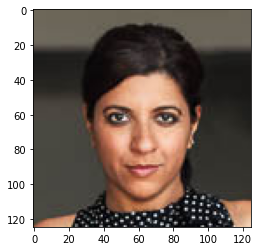

Attributes: ['make forbes india', 'make forbes', 'made heaven helped', 'web series', 'web', 'success gully boy', 'success gully', 'made heaven', 'heaven', 'helped', 'gully boy', 'gully', 'filmmaker', 'series'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 83.0

-----------------------------------------------

Name: Karthik Subbaraj


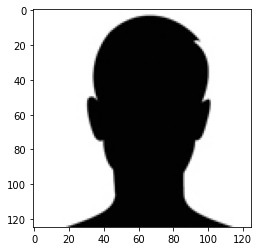

Attributes: ['rajinikanth film petta', 'rajinikanth film', 'petta garnered crore', 'petta garnered', 'petta', 'old karthik subbaraj', 'old karthik', 'managed rope rajinikanth', 'managed rope', 'rajinikanth', 'managed', 'garnered', 'old', 'film'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 84.0

-----------------------------------------------

Name: Sunil Chhetri


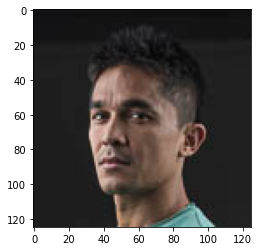

Attributes: ['list indian footballer', 'list indian', 'dropping', 'rank forbes india', 'rank forbes', 'list', 'india celebrity list', 'rank', 'india celebrity', 'forbes india celebrity', 'forbes india', 'forbes', 'celebrity list', 'celebrity'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 85.0

-----------------------------------------------

Name: Remo D'Souza


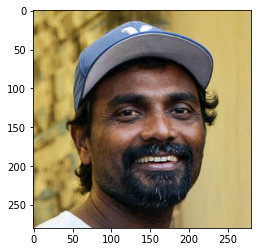

Attributes: ['celebrity list last', 'souza', 'list last year', 'list last', 'dropped', 'choreographer', 'last year', 'last', 'india celebrity list', 'india celebrity', 'forbes india celebrity', 'forbes india', 'forbes', 'director'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 86.0

-----------------------------------------------

Name: Mary Kom


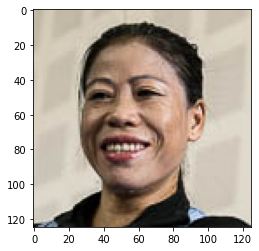

Attributes: ['medal', 'mary kom make', 'mary kom', 'making history first', 'make comeback celebrity', 'list making history', 'list making', 'making history', 'mary', 'make comeback', 'eight', 'history', 'comeback', 'win'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 87.0

-----------------------------------------------

Name: Mithali Raj


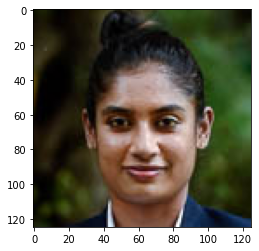

Attributes: ['raj debut list', 'raj debut', 'professional cricketer highest', 'mithali raj debut', 'mithali raj', 'mithali', 'list th year', 'list th', 'professional cricketer', 'debut list', 'cricketer', 'professional', 'player', 'woman'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 88.0

-----------------------------------------------

Name: Raveena Tandon


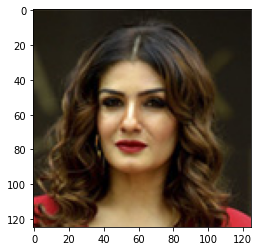

Attributes: ['nach baliye', 'nach', 'make list backed', 'list backed earnings', 'list backed', 'make list', 'backed earnings', 'backed', 'judge', 'reality', 'earnings', 'dance', 'make', 'star'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 89.0

-----------------------------------------------

Name: Smriti Mandhana


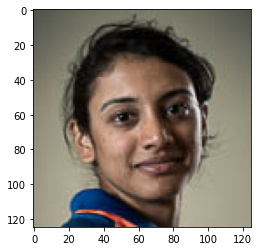

Attributes: ['poised become next', 'poised become', 'poised', 'next big thing', 'mandhana poised become', 'mandhana poised', 'mandhana', 'woman cricket', 'thing', 'youngest', 'next big', 'captain', 'cricket', 'woman'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 90.0

-----------------------------------------------

Name: Harmanpreet Kaur


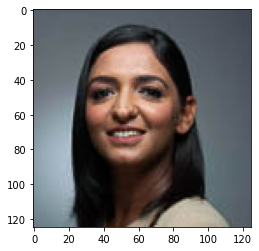

Attributes: ['woman cricket', 'like never', 'kaur', 'cricket', 'never', 'given', 'woman', 'character', 'like'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 91.0

-----------------------------------------------

Name: Karan Kundra


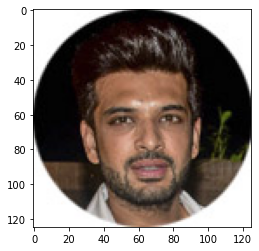

Attributes: ['television actor', 'kundra', 'drop', 'rank forbes india', 'rank forbes', 'despite', 'karan', 'television', 'india celebrity list', 'rank', 'india celebrity', 'forbes india celebrity', 'forbes india', 'forbes'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 92.0

-----------------------------------------------

Name: Bajrang Punia


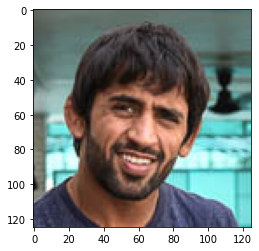

Attributes: ['punia make debut', 'punia make', 'punia', 'list rank estimated', 'make debut list', 'debut list rank', 'debut list', 'make debut', 'earnings crore', 'list rank', 'earnings', 'crore', 'make', 'rank'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 94.0

-----------------------------------------------

Name: Anirban Lahiri


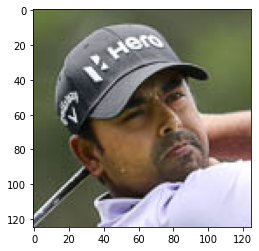

Attributes: ['half', 'golfer', 'drop', 'following', 'year'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 95.0

-----------------------------------------------

Name: Ranveer Brar


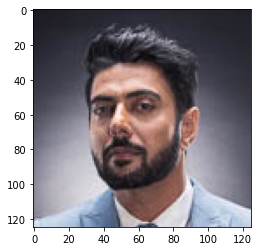

Attributes: ['popular travel led', 'popular travel', 'list riding popular', 'led tv', 'travel', 'list riding', 'led', 'highest earning', 'earning', 'ranveer', 'celebrity chef', 'second highest', 'chef', 'riding'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 96.0

-----------------------------------------------

Name: Vikas Khanna


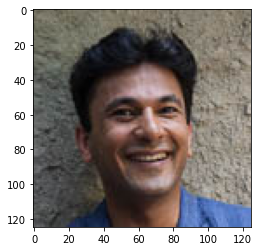

Attributes: ['michelin starred manhattan', 'michelin starred', 'michelin', 'manhattan restaurant junoon', 'manhattan restaurant', 'manhattan', 'make list debut', 'list debut celebrity', 'list debut', 'make list', 'chef category', 'celebrity chef category', 'celebrity chef', 'chef'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 97.0

-----------------------------------------------

Name: Rohan Bopanna


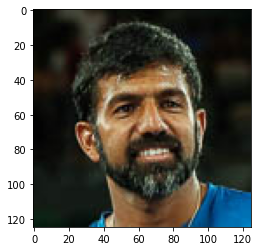

Attributes: ['playing several grand', 'playing several', 'master series', 'tournament', 'active', 'grand', 'master', 'playing', 'series', 'several'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 98.0

-----------------------------------------------

Name: Vicky Ratnani


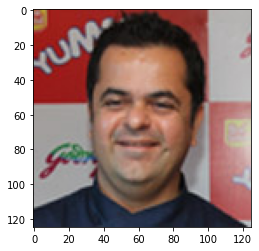

Attributes: ['vicky', 'web series', 'web', 'list year', 'chef', 'debut forbes india', 'debut forbes', 'series', 'india celebrity list', 'india celebrity', 'forbes india celebrity', 'forbes india', 'forbes', 'celebrity list'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 99.0

-----------------------------------------------

Name: Saransh Goila


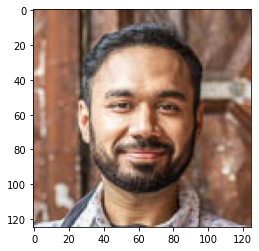

Attributes: ['number brand endorsement', 'number brand', 'medium fame number', 'make celebrity debut', 'make celebrity', 'cashing', 'social medium fame', 'medium fame', 'brand endorsement', 'social medium', 'endorsement', 'social', 'medium', 'brand'] 
Born: nan

Nickname: nan

Height:  nan

Birth Name: nan

Rank: 100.0

-----------------------------------------------



In [3]:
for i in range (0,174):
    print("Name: " + df["name"][i])
    try:
        response = requests.get(df["img_x"][i])
        img = Image.open(BytesIO(response.content))
        imgplot = plt.imshow(img)
        plt.show()
    except:
        try:
            response = requests.get(df["img_y"][i])
            img = Image.open(BytesIO(response.content))
            imgplot = plt.imshow(img)
            plt.show()
        except:
            print("No image")
    print("Attributes: " , end ="")
    for attribute in df["attributes"][i].split():
        print(attribute , end =" ")
    print()
    print('Born: '+ str(df["born"][i]))
    print()
    print('Nickname: '+ str(df["nickname"][i]))
    print()
    print('Height:  '+ str(df["height"][i]))
    print()
    print('Birth Name: '+ str(df["birth name"][i]))
    print()
    print('Rank: '+ str(df["rank"][i]))
    print()
    print("-----------------------------------------------")
    print()